# Derniers résultats

Ce dernier notebook regroupe les derniers résultats. Après maintes reprises, nous sommes parvenus à travailler avec "data_ss_gpp_time" qui est le dataset initial restreint au rayonnement, le vpd, la température ainsi que les SWCs comme des features d'entrée pour l'entrainement du modèle (*LSTM* ayant constamment démontré les meilleurs résultats).
Cette restriction est dûe au fait que le modèle présentait une forte dépendance à l'égard de ses propres composantes de GPP (à des instants antérieurs pour prédire les valeurs futures) ainsi que le temps (qu'on a supposé inclu tacitement dans le rayonnement). Le modèle devrait par conséquent prédire les composantes du gpp en se basant exclusivement sur ces entrées.


### Lire et préparer les données

#### Importer les bibliothèques nécessaires

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import math
import time
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
sns.set_style("darkgrid")
#sns.set(style=None)

#### Lire les données

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/inrae/icos/final-preprocessed-FR-Bil_2015_2022-second-gpp-decomp.csv')
# data = pd.read_csv('../data/final-preprocessed-FR-Bil_2015_2022-second-gpp-decomp.csv') si téléchargé depuis github
data['DateTime'] = pd.to_datetime(data['DateTime'])
data.head()

,Unnamed: 0,Year,DoY,station.name,DateTime,Tair,Rg,GPP,VPD,NEE_F,...,SMSSO4_10cm_3491_Avg,SMSSO4_22cm_4663_Avg,SMSSO4_40cm_4925_Avg,SMSSO4_60cm_3176_Avg,SMSSO4_85cm_5508_Avg,GPP_noise,GPP_ann,GPP_anomalies,cos year,sin year
0,1,2015,1,FR-Bil,2015-01-01,2.129500,236.455278,3.646765,2.606778,-2.056866,...,0.086700,0.163156,0.061558,0.057044,0.069011,0.762554,5.452100,-2.567889,1.000000,0.000000
1,2,2015,2,FR-Bil,2015-01-02,4.807500,181.507111,4.409038,2.355167,-2.559287,...,0.084119,0.160910,0.059802,0.055472,0.068502,0.782234,5.422189,-1.795385,0.999852,0.017213
2,3,2015,3,FR-Bil,2015-01-03,11.026647,81.873765,4.439173,1.910706,-1.959193,...,0.082899,0.159007,0.058179,0.053987,0.067753,0.063957,5.420821,-1.045605,0.999407,0.034422
3,4,2015,4,FR-Bil,2015-01-04,12.877941,94.259353,6.243830,2.051529,-3.564290,...,0.086224,0.159345,0.056857,0.052661,0.066953,1.145975,5.435837,-0.337982,0.998667,0.051620
4,5,2015,5,FR-Bil,2015-01-05,6.067889,169.532833,7.797282,0.669667,-5.804766,...,0.086753,0.160409,0.056400,0.051847,0.066715,2.032368,5.453269,0.311645,0.997630,0.068802


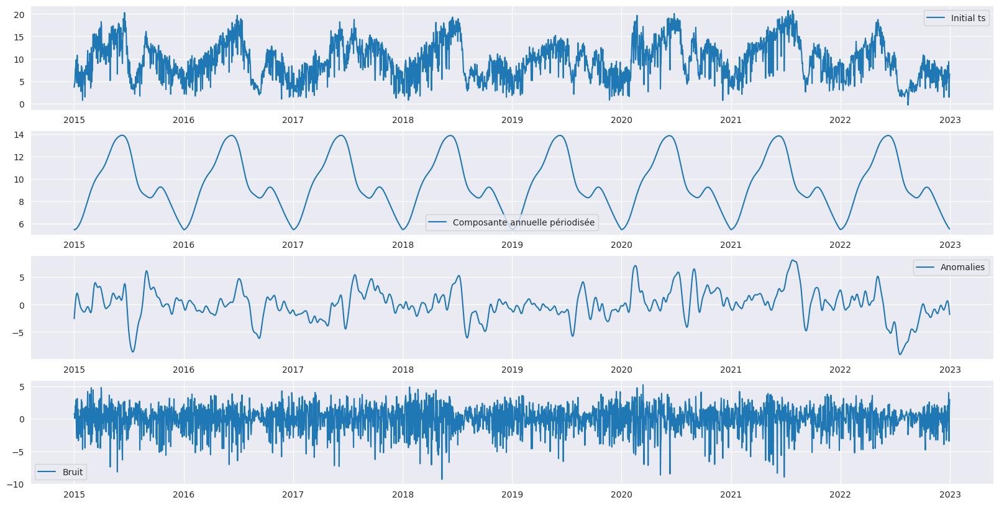

In [ ]:
plt.figure(figsize=(20,10))

plt.subplot(411)
plt.plot(data['DateTime'], data['GPP'])
plt.legend(['Initial ts'])

plt.subplot(412)
plt.plot(data['DateTime'], data['GPP_ann'])
plt.legend(['Composante annuelle périodisée'])

plt.subplot(413)
plt.plot(data['DateTime'], data['GPP_anomalies'])
plt.legend(['Anomalies'])

plt.subplot(414)
plt.plot(data['DateTime'], data['GPP_noise'])
plt.legend(['Bruit'])

plt.show()

In [ ]:
data.columns

Index(['Unnamed: 0', 'Year', 'DoY', 'station.name', 'DateTime', 'Tair', 'Rg',
       'GPP', 'VPD', 'NEE_F', 'RECO', 'P', 'SMSSO4_10cm_3491_Avg',
       'SMSSO4_22cm_4663_Avg', 'SMSSO4_40cm_4925_Avg', 'SMSSO4_60cm_3176_Avg',
       'SMSSO4_85cm_5508_Avg', 'GPP_noise', 'GPP_ann', 'GPP_anomalies',
       'cos year', 'sin year'],
      dtype='object')

#### Préparation des données & helper functions

In [ ]:
# les colonnes à garder pour l'entrée
# Composantes GPP + Rg + Tair + VPD + SWCs + Temps
df = data[['GPP_ann', 'GPP_anomalies',  'GPP_noise', 'Rg', 'Tair', 'VPD','SMSSO4_10cm_3491_Avg', 'SMSSO4_22cm_4663_Avg', 'SMSSO4_40cm_4925_Avg', 'SMSSO4_60cm_3176_Avg', 'SMSSO4_85cm_5508_Avg', 'cos year', 'sin year']]


data_ss_gpp_time = data[['Rg', 'Tair', 'VPD','SMSSO4_10cm_3491_Avg', 'SMSSO4_22cm_4663_Avg', 'SMSSO4_40cm_4925_Avg', 'SMSSO4_60cm_3176_Avg', 'SMSSO4_85cm_5508_Avg']]
data_ss_gpp_time.head()

,Rg,Tair,VPD,SMSSO4_10cm_3491_Avg,SMSSO4_22cm_4663_Avg,SMSSO4_40cm_4925_Avg,SMSSO4_60cm_3176_Avg,SMSSO4_85cm_5508_Avg
0,236.455278,2.129500,2.606778,0.086700,0.163156,0.061558,0.057044,0.069011
1,181.507111,4.807500,2.355167,0.084119,0.160910,0.059802,0.055472,0.068502
2,81.873765,11.026647,1.910706,0.082899,0.159007,0.058179,0.053987,0.067753
3,94.259353,12.877941,2.051529,0.086224,0.159345,0.056857,0.052661,0.066953
4,169.532833,6.067889,0.669667,0.086753,0.160409,0.056400,0.051847,0.066715


In [ ]:
"""
fonction qui à partir du dataframe, crée des séquences sous forme de
[ [Rg(t-L),Tair(t-L),VPD(t-L),SWCs(t-L)], [Rg(t-L+1),Tair(t-L+1),VPD(t-L+1),SWCs(t-L+1)] , ... , [Rg(t),Tair(t),VPD(t),SWCs(t)] ]
et des targets à t+1 : [GPP_ann(t+1), gpp_anomalies(t+1), gpp_bruit(t+1)]
avec L : longueur choisie de la séquence
l'intérêt d'avoir 3 sorties est d'évaluer chaque composante individuellement
"""

def inputs_outputs(sequence_length, data, data_ss_gpp_time):
    """
    fonction qui prend en entrée des datasets
    et retourne des séquences d'entrée pour entrainer le modèle
    ainsi que les valeurs cibles
    """
    data = np.array(data)
    data_ss_gpp_time = np.array(data_ss_gpp_time)
    sequences = []
    targets = []
    for i in range(0,len(data)-sequence_length-1):
        sequence = data_ss_gpp_time[i:i+sequence_length] # entrée : features de (t-L) jusqu'à t
        target = data[i+sequence_length][:3] # les 3 composantes du gpp à t+1 # [GPP_ann(t+1), GPP_anomalies(t+1), GPP_noise(t+1)]
        sequences.append(sequence)
        targets.append(target)

    sequences = np.array(sequences)
    targets = np.array(targets)

    return sequences, targets

In [ ]:
import torch

if torch.cuda.is_available():
    device = torch.device('cuda') # gpu
else:
    device = torch.device('cpu')  # cpu

In [ ]:
print(device)

cuda


In [ ]:
from sklearn.model_selection import train_test_split

def load_data(sequences, targets, batch_size=32, test_size=0.2):
    """
    Prépare les données pour l'entraînement et les tests d'un modèle

    Args :
    - sequences
    - targets
    - test_size (% des données à consacrer pour le test (& validation))
    - batch_size

    Retourne :
    - train_loader
    - test_loader
    """

    # Division (aléatoire) des données en ensembles d'entraînement et de test
    X_train, X_test, y_train, y_test = train_test_split(sequences, targets, test_size=test_size, random_state=19)

    # Conv les tableaux np en tenseurs torch
    X_train_tensor = torch.from_numpy(X_train).float().to(device)               # [nbr_seq_train, seq_len, n_features]
    y_train_tensor = torch.from_numpy(y_train).float().to(device)               # [nbr_seq_train, output_size]

    X_test_tensor = torch.from_numpy(X_test).float().to(device)                 # [nbr_seq_test, seq_len, n_features]
    y_test_tensor = torch.from_numpy(y_test).float().to(device)                 # [nbr_seq_test, output_size]

    # Loader les ensembles de données
    train_ds = torch.utils.data.TensorDataset(X_train_tensor, y_train_tensor)
    train_loader = torch.utils.data.DataLoader(train_ds, batch_size=batch_size, shuffle=False)
    test_ds = torch.utils.data.TensorDataset(X_test_tensor, y_test_tensor)
    test_loader = torch.utils.data.DataLoader(test_ds, batch_size=batch_size, shuffle=False)

    return train_loader, test_loader

In [ ]:
sequence_length = 400
sequences, targets = inputs_outputs(sequence_length, df, data_ss_gpp_time)
print(sequences.shape, targets.shape) # seq_len=400, features=13

train_loader, test_loader = load_data(sequences, targets)
print("nbr_seq_train : ", len(train_loader)*train_loader.batch_size)
print("nbr_seq_test : ", len(test_loader)*train_loader.batch_size)

(2521, 400, 8) (2521, 3)
nbr_seq_train :  2016
nbr_seq_test :  512


#### Fonction loss

In [ ]:
def my_loss_fct(weights_matrix):
  """
  fonction custom pour calculer le loss
  """
  weights_matrix=torch.tensor(weights_matrix,dtype=torch.float32).to(device)
  def loss(y_true, y_pred):
      weighted_error=torch.square(y_true - y_pred)*weights_matrix # choisir les composantes à prendre en compte et les composantes à ignorer
      return torch.mean(weighted_error)
  return loss

In [ ]:
loss_ann=my_loss_fct([[1,0,0]])            # calculer l'erreur sur les anomalies
loss_anomalies=my_loss_fct([[0,1,0]])      # calculer l'erreur sur le cycle jour et nuit
loss_noise=my_loss_fct([[0,0,1]])          # calculer l'erreur sur le bruit restant

### Modèles Torch

#### Modèle LSTM

In [ ]:
from torch import nn

########################  LSTM/GRU  ############################################################

"""
LSTM ou GRU (2 couches) \\\\\\\ unidirectionnel/bidirectionnel
"""

class LSTM_GRU(nn.Module):
    def __init__(self, sequence_length, features, nbr_sorties, hidden_dim1, hidden_dim2, num_layers, num_dir, dropout=0.2, rnn_type='lstm'):
        super(LSTM_GRU, self).__init__()

        self.sequence_length = sequence_length
        self.features = features
        self.nbr_sorties = nbr_sorties
        self.num_layers = num_layers
        self.hidden_dim1 = hidden_dim1
        self.hidden_dim2 = hidden_dim2
        self.num_dir = num_dir          # nombre de directions du RNN (1 pour unidirectionnel, 2 pour bidirectionnel)
        self.rnn_type = rnn_type        # le type de couche RNN à utiliser, soit "lstm" soit "gru"

        if self.rnn_type == 'lstm':
            self.rnn1 = nn.LSTM(
                input_size=features,
                hidden_size=hidden_dim1,
                num_layers=num_layers,
                dropout=dropout,
                bidirectional=(self.num_dir==2),
                batch_first=True)
            self.rnn2 = nn.LSTM(
                input_size=hidden_dim1*num_dir,
                hidden_size=hidden_dim2,
                num_layers=num_layers,
                dropout=dropout,
                bidirectional=(self.num_dir==2),
                batch_first=True)
        elif self.rnn_type == 'gru':
            self.rnn1 = nn.GRU(
                input_size=features,
                hidden_size=hidden_dim1,
                num_layers=num_layers,
                dropout=dropout,
                bidirectional=(self.num_dir==2),
                batch_first=True)
            self.rnn2 = nn.GRU(
                input_size=hidden_dim1*num_dir,
                hidden_size=hidden_dim2,
                num_layers=num_layers,
                dropout=dropout,
                bidirectional=(self.num_dir==2),
                batch_first=True)
        else:
            raise ValueError("Invalid rnn_type. Choose either 'lstm' or 'gru'!!")

        # Couche linéaire pour les prédictions finales
        self.linear = nn.Linear(
            in_features=hidden_dim2*num_dir,
            out_features=nbr_sorties)

    def init_hidden(self, batch_size):
        num_directions = 2 if self.num_dir == 2 else 1
        if self.rnn_type == 'lstm':
            h_t1, c_t1 = torch.zeros(self.num_layers*self.num_dir, batch_size, self.hidden_dim1), torch.zeros(self.num_layers*self.num_dir, batch_size, self.hidden_dim1)
            h_t2, c_t2 = torch.zeros(self.num_layers*self.num_dir, batch_size, self.hidden_dim2), torch.zeros(self.num_layers*self.num_dir, batch_size, self.hidden_dim2)
        elif self.rnn_type == 'gru':
            h_t1, c_t1 = torch.zeros(self.num_layers*num_directions, batch_size, self.hidden_dim1), torch.zeros(self.num_layers*num_directions, batch_size, self.hidden_dim1)
            h_t2, c_t2 = torch.zeros(self.num_layers*num_directions, batch_size, self.hidden_dim2), torch.zeros(self.num_layers*num_directions, batch_size, self.hidden_dim2)
        else:
            raise ValueError("Invalid RNN type. Choose either 'lstm' or 'gru'!!")
        return h_t1.to(device), c_t1.to(device), h_t2.to(device), c_t2.to(device)

    def forward(self, X):
        batch_size = X.size(0)
        h_t1, c_t1, h_t2, c_t2 = self.init_hidden(batch_size)

        if self.rnn_type == 'lstm':
            rnn_out, (h_t1, c_t1) = self.rnn1(X, (h_t1, c_t1))
            rnn_out, (h_t2, c_t2) = self.rnn2(rnn_out, (h_t2, c_t2))
        elif self.rnn_type == 'gru':
            rnn_out, h_t1 = self.rnn1(X, h_t1)
            rnn_out, h_t2 = self.rnn2(rnn_out, h_t2)

        rnn_out = rnn_out[:,-1,:] # sélectionner le dernier pas de temps dans chaque séquence
        y_pred = self.linear(rnn_out)

        return y_pred

### Training

#### L'entrainement du modèle

In [ ]:
def test(mod, test_loader, my_loss_fct):
    mod.train(False)
    total_loss, nbatch = 0., 0
    for batch in test_loader:
        sequences, target = batch
        sequences, target = sequences.to(device), target.to(device)
        pred_target = mod(sequences)
        loss = my_loss_fct(target, pred_target) # fonction de loss personnalisée
        total_loss += loss.item()
        nbatch += 1
    total_loss /= float(nbatch)
    mod.train(True)
    return total_loss

In [ ]:
from datetime import datetime, timedelta

def format_time(seconds):
    """
    fonction pour formater le temps écoulé (exprimé en sec)
    """
    td = timedelta(seconds=seconds)
    d = datetime(1, 1, 1)+td

    if d.hour > 0:
        return f"{d.hour}h {d.minute:02d}min {d.second:02d}s"
    elif d.minute > 0 :
        return f"{d.minute:02d}min {d.second:02d}s"
    elif d.second > 0:
      return f"{d.second:02d}s {d.microsecond // 1000}ms"
    else:
      return f"{d.microsecond // 1000}ms"

In [ ]:
def train(mod, nepochs, learning_rate, my_loss_fct, train_loader, test_loader, path='', verbose=True, save_best_only=True, early_stopping=False, patience=20, epo=100):
    mod.to(device)
    mod.train()
    optim = torch.optim.Adam(mod.parameters(), lr=learning_rate)
    test_loss_vect, train_loss_vect = [], []
    best_validation_loss = float('inf')  # initialiser le best loss
    best_model = None
    epochs_no_imp = 0

    print('Start training...')
    print()

    start_time_global = time.time()

    for epoch in range(nepochs):
        test_loss = test(mod, test_loader, my_loss_fct)
        total_loss, nbatch = 0., 0

        start_time = time.time()

        for batch in train_loader:
            sequences, target = batch
            sequences, target = sequences.to(device), target.to(device)
            optim.zero_grad()
            pred_target = mod(sequences)
            loss = my_loss_fct(target, pred_target)
            total_loss += loss.item()
            nbatch += 1
            loss.backward()
            optim.step()

        total_loss /= float(nbatch)

        test_loss_vect.append(test_loss)
        train_loss_vect.append(total_loss)

        end_time = time.time()

        # Sauvegarder le meilleur modèle avec le meilleur loss de validation
        if save_best_only:
          if test_loss < best_validation_loss:
              best_validation_loss = test_loss
              best_model = mod

        # Arrêter l'entrainement quand le loss de validation cesse de s'améliorer ou commence à se détériorer
        if early_stopping :
          if test_loss < best_validation_loss:
            best_validation_loss = test_loss
            best_model = mod
            epochs_no_imp = 0
          else:
            epochs_no_imp += 1
          if epochs_no_imp >= patience:
            print()
            print('-'*130)
            print(f"Early stopping à l'époque {epoch+1} - Aucune amélioration pendant {patience} époques.")
            print('-'*130)
            torch.save(best_model, path)
            break

        if verbose and (epoch+1)%epo==0:
            epoch_time = end_time - start_time
            print(f"Epoch [{epoch+1:>{len(str(nepochs))}}/{nepochs}] {'='*30} {format_time(epoch_time).ljust(9)} /step - train loss: {total_loss:.4f} - validation loss: {test_loss:.4f}".ljust(len(f"Epoch [{nepochs}/{nepochs}]")))

    end_time_global = time.time()
    global_time = end_time_global - start_time_global

    print()
    print('End training...')
    print(f"Fin Epoch [{epoch+1}/{nepochs}] {'='*30} training time: {format_time(global_time)} - train loss: {total_loss:.4f} - validation loss: {test_loss:.4f}")
    print()

    if save_best_only:
      torch.save(best_model, path)
      print('-'*130)
      print(f"Modèle retenu avec best validation loss : {best_validation_loss:.4f} trouvé au bout de {np.argmin(test_loss_vect)+1} époques.")
      print('-'*130)
    return best_model, train_loss_vect, test_loss_vect

In [ ]:
# Hyperparamètres
input_dim = len(data_ss_gpp_time.values[0])  # nombre de features
output_dim = 3
hidden_dim1 = 64
hidden_dim11 = hidden_dim1//2
hidden_dim2 = 64
hidden_dim22 = hidden_dim2*2//2
num_layers = 2
num_dir = 2

# n_epochs = 200
# lr = 0.001

#mse = nn.MSELoss()

In [ ]:
# la fonction que j'ai utilisée (en travaillant sur le drive/colab)
def get_path(model_name, model_type, folder='/content/drive/MyDrive/inrae/mymodels/', extension='pth'):
  model_type = model_type + '_second_decomp'
  return f"{folder}{model_type}/{model_name}.{extension}"

# la fonction à utiliser en local
# def get_path(model_name, model_type, folder='../models/', extension='pth'):
#   model_type = model_type + '_second_decomp'
#   return f"{folder}{model_type}/{model_name}.{extension}"

#### LSTM Sans gpp ni temps en entrée + tous les SWC

on entraine le modèle en prenant en entrée uniquement le rayonnement, la température, le vpd ainsi que tous les SWCs, pour éviter tout excès de dépendance sur des features comme les composantes du GPP ou encore le temps. L'erreur étant minimisé sur chaque composante séparément.

##### Anomalies

In [ ]:
# Erreur seulement sur les anomalies (sans GPP en entrée+un seul swc)

lr = 0.0001
n_epochs=5000
lstm_anomalies = LSTM_GRU(sequence_length, input_dim, output_dim , hidden_dim1, hidden_dim2, num_layers, num_dir, rnn_type='lstm')
lstm_anomalies.to(device)
path = get_path('best_lstm_anomalies_0.0001_ss_gpp_time','lstm')

best_lstm_anomalies, train_loss_history_lstm_anomalies, test_loss_history_lstm_anomalies = train(lstm_anomalies, n_epochs, lr, loss_anomalies, train_loader, test_loader, path,verbose=True, save_best_only=True, epo=500)

Start training...

Epoch [ 500/5000] ============================== 914ms     /step - train loss: 0.0093 - validation loss: 0.0104
Epoch [1000/5000] ============================== 928ms     /step - train loss: 0.0063 - validation loss: 0.0049
Epoch [1500/5000] ============================== 909ms     /step - train loss: 0.0023 - validation loss: 0.0020
Epoch [2000/5000] ============================== 939ms     /step - train loss: 0.0125 - validation loss: 0.0144
Epoch [2500/5000] ============================== 940ms     /step - train loss: 0.0008 - validation loss: 0.0006
Epoch [3000/5000] ============================== 939ms     /step - train loss: 0.0005 - validation loss: 0.0007
Epoch [3500/5000] ============================== 910ms     /step - train loss: 0.0006 - validation loss: 0.0007
Epoch [4000/5000] ============================== 907ms     /step - train loss: 0.0003 - validation loss: 0.0005
Epoch [4500/5000] ============================== 911ms     /step - train loss: 0.0004

In [ ]:
torch.save(lstm_anomalies, get_path('last_lstm_anomalies_0.0001_ss_gpp_time_5000epo','lstm'))

In [ ]:
print(train_loss_history_lstm_anomalies)
print(test_loss_history_lstm_anomalies)

[2.458690121060326, 2.424127011072068, 2.211545321676466, 1.9962281007615348, 1.8337868669676403, 1.619229667716556, 1.5090656535966056, 1.3434932392741006, 1.3041005673862638, 1.3114344449270339, 1.1840374422451807, 1.171998743973081, 1.041111219496954, 1.0596715003725081, 1.076709819218469, 1.0375078202240051, 0.9120142459869385, 0.9009178271369328, 0.8419643678362407, 0.7802637531643822, 0.7932613132491945, 0.7184419764412774, 0.7057703142128293, 0.738640618702722, 0.7289321942934914, 0.607674075970574, 0.5750910649223934, 0.587866329011463, 0.6067198368292006, 0.557292157695407, 0.612570221461947, 0.47050009123862735, 0.44614656837213607, 0.4731520121059721, 0.45392417813104297, 0.39993140054127524, 0.47827465879538705, 0.45975028309557175, 0.4125899270413414, 0.39423916051312097, 0.35944494510453845, 0.32913134637333097, 0.35246658467111136, 0.3986197572851938, 0.33850849029563723, 0.31446736743525855, 0.2889817702391791, 0.24963996192765614, 0.2542243018036797, 0.2687754531701405

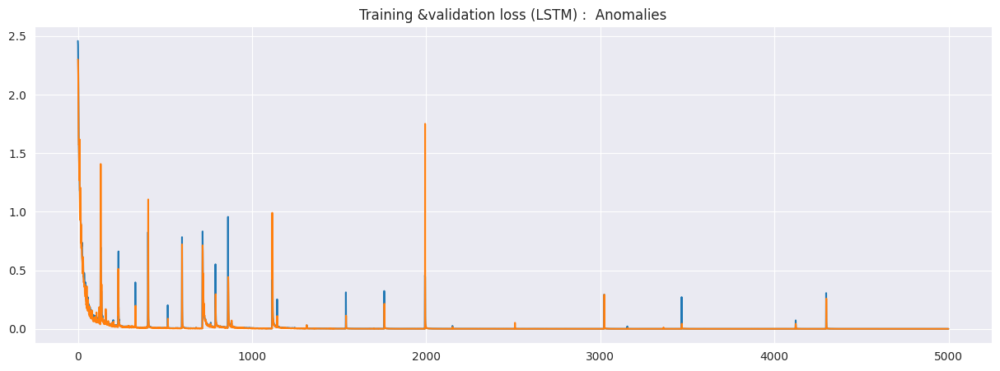

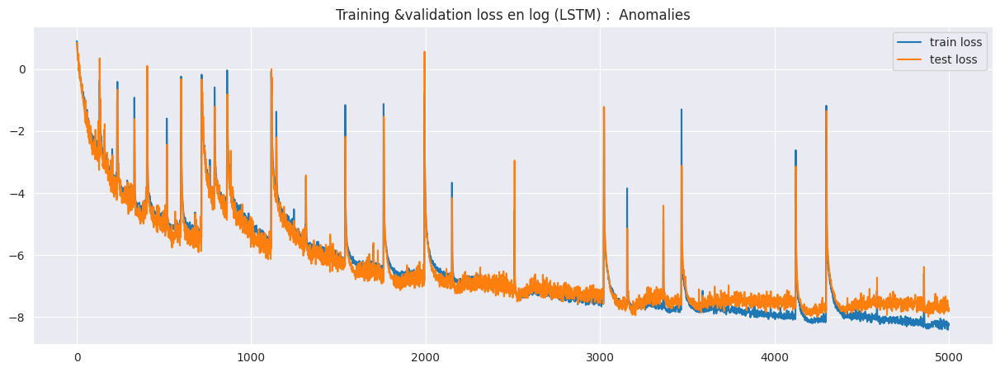

In [ ]:
# Courbes loss : Sans gpp/temps + tous les swc

plt.figure(figsize=(15,5))
plt.plot(train_loss_history_lstm_anomalies, label='train loss')
plt.plot(test_loss_history_lstm_anomalies, label='test loss')
plt.title('Training &validation loss (LSTM) :  Anomalies')
plt.show()

plt.figure(figsize=(15,5))
plt.plot([math.log(loss) for loss in train_loss_history_lstm_anomalies], label='train loss')
plt.plot([math.log(loss) for loss in test_loss_history_lstm_anomalies], label='test loss')
plt.title('Training &validation loss en log (LSTM) :  Anomalies')
plt.legend()
plt.show()

##### Annual gpp

In [ ]:
# Erreur seulement sur la composante annuelle (sans GPP/time en entrée+un seul swc)

lr = 0.0001
n_epochs=1000
lstm_ann = LSTM_GRU(sequence_length, input_dim, output_dim , hidden_dim1, hidden_dim2, num_layers, num_dir, rnn_type='lstm')
lstm_ann.to(device)
path = get_path('best_lstm_ann_0.0001_ss_gpp_time','lstm')

best_lstm_ann, train_loss_history_lstm_ann, test_loss_history_lstm_ann = train(lstm_ann, n_epochs, lr, loss_ann, train_loader, test_loader, path,verbose=True, save_best_only=True, epo=100)

Start training...

Epoch [ 100/1000] ============================== 963ms     /step - train loss: 0.0168 - validation loss: 0.0050
Epoch [ 200/1000] ============================== 01s 516ms /step - train loss: 0.0058 - validation loss: 0.0110
Epoch [ 300/1000] ============================== 912ms     /step - train loss: 0.0032 - validation loss: 0.0021
Epoch [ 400/1000] ============================== 921ms     /step - train loss: 0.0024 - validation loss: 0.0036
Epoch [ 500/1000] ============================== 01s 554ms /step - train loss: 0.0015 - validation loss: 0.0020
Epoch [ 600/1000] ============================== 908ms     /step - train loss: 0.0012 - validation loss: 0.0008


In [ ]:
torch.save(lstm_ann, get_path('last_lstm_ann_0.0001_ss_gpp_time_1000epo','lstm'))

In [ ]:
print(train_loss_history_lstm_ann)
print(test_loss_history_lstm_ann)

In [ ]:
# Annual GPP
# Courbes loss : Sans gpp/temps + tous les swc

plt.figure(figsize=(15,5))
plt.plot(train_loss_history_lstm_ann, label='train loss')
plt.plot(test_loss_history_lstm_ann, label='test loss')
plt.title('Training &validation loss (LSTM) : Annual gpp')
plt.show()

plt.figure(figsize=(15,5))
plt.plot([math.log(loss) for loss in train_loss_history_lstm_ann], label='train loss')
plt.plot([math.log(loss) for loss in test_loss_history_lstm_ann], label='test loss')
plt.title('Training &validation loss en log (LSTM) :  Annual gpp')
plt.legend()
plt.show()

##### Noise

In [ ]:
# Erreur seulement sur le noise (sans GPP/time en entrée+un seul swc)

lr = 0.0001
n_epochs=5000
lstm_noise = LSTM_GRU(sequence_length, input_dim, output_dim , hidden_dim1, hidden_dim2, num_layers, num_dir, rnn_type='lstm')
lstm_noise.to(device)
path = get_path('best_lstm_noise_0.0001_ss_gpp_time','lstm')

best_lstm_noise, train_loss_history_lstm_noise, test_loss_history_lstm_noise = train(lstm_noise, n_epochs, lr, loss_noise, train_loader, test_loader, path,verbose=True, save_best_only=True, epo=500)

Start training...

Epoch [ 500/5000] ============================== 914ms     /step - train loss: 0.5164 - validation loss: 1.5886
Epoch [1000/5000] ============================== 919ms     /step - train loss: 0.1492 - validation loss: 1.7067
Epoch [1500/5000] ============================== 914ms     /step - train loss: 0.0533 - validation loss: 1.7133
Epoch [2000/5000] ============================== 913ms     /step - train loss: 0.0220 - validation loss: 1.7236
Epoch [2500/5000] ============================== 907ms     /step - train loss: 0.0132 - validation loss: 1.7524
Epoch [3000/5000] ============================== 912ms     /step - train loss: 0.0150 - validation loss: 1.7395
Epoch [3500/5000] ============================== 910ms     /step - train loss: 0.0073 - validation loss: 1.7286
Epoch [4000/5000] ============================== 916ms     /step - train loss: 0.0060 - validation loss: 1.7339
Epoch [4500/5000] ============================== 949ms     /step - train loss: 0.0044

In [ ]:
torch.save(lstm_noise, get_path('last_lstm_noise_0.0001_ss_gpp_time_5000epo','lstm'))

In [ ]:
print(train_loss_history_lstm_noise)
print(test_loss_history_lstm_noise)

[1.272305463041578, 1.2712983640413436, 1.2711539334721036, 1.2699994974666171, 1.268692604133061, 1.2668240316330441, 1.2643819110734122, 1.2635423105860513, 1.2627483256279477, 1.2616341407336886, 1.2609532115951416, 1.2599140424577018, 1.2588208686737787, 1.2572807168203688, 1.2560548602588593, 1.2546436815034776, 1.2529945685749961, 1.250809169004834, 1.249090728305635, 1.2467119230164423, 1.2448629244925484, 1.2450241143741305, 1.2427590073101105, 1.2387795940278068, 1.2417016994385492, 1.2420692254626562, 1.2393970016449216, 1.2391908490468586, 1.2343566881285772, 1.2383535220509483, 1.2314033196085976, 1.2354240729695274, 1.2362795841126215, 1.2339017854796515, 1.2311736335830084, 1.239183767447396, 1.231731060951475, 1.2326832006848047, 1.2272753308689783, 1.2300058205922444, 1.227593956485627, 1.2320131971722557, 1.2266905478068761, 1.2285287578900654, 1.2262866591650343, 1.2242019857679094, 1.2211008573335314, 1.227789650833796, 1.2214859657817416, 1.2289327789866735, 1.22032

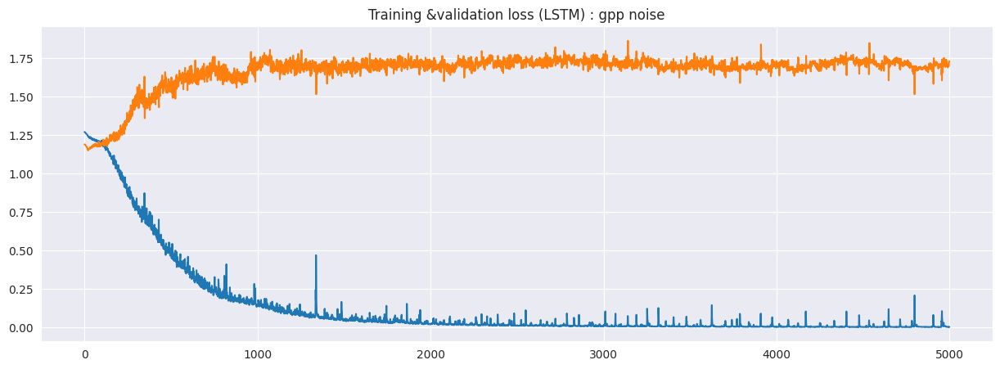

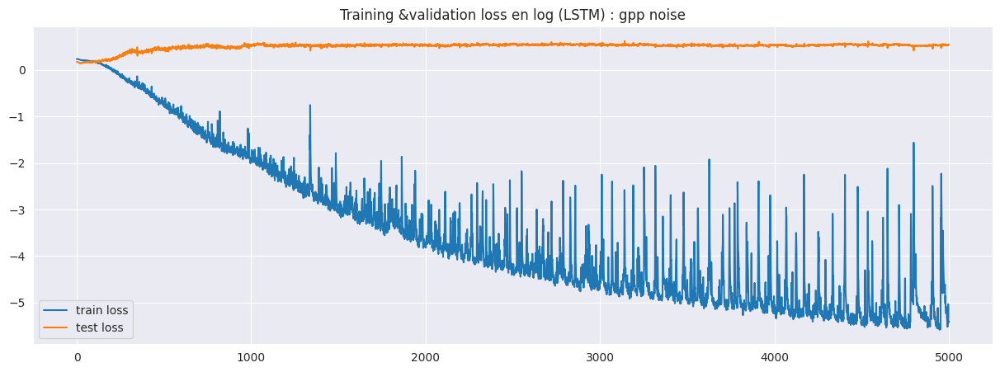

In [ ]:
# GPP noise
# Courbes loss : Sans gpp/temps + tous les swc

plt.figure(figsize=(15,5))
plt.plot(train_loss_history_lstm_noise, label='train loss')
plt.plot(test_loss_history_lstm_noise, label='test loss')
plt.title('Training &validation loss (LSTM) : gpp noise')
plt.show()

plt.figure(figsize=(15,5))
plt.plot([math.log(loss) for loss in train_loss_history_lstm_noise], label='train loss')
plt.plot([math.log(loss) for loss in test_loss_history_lstm_noise], label='test loss')
plt.title('Training &validation loss en log (LSTM) : gpp noise')
plt.legend()
plt.show()

In [ ]:
# Loader les modèles entrainés
best_lstm_ann=torch.load(get_path('best_lstm_ann_0.0001_ss_gpp_time','lstm'))
best_lstm_ann.to(device)

best_lstm_anomalies=torch.load(get_path('best_lstm_anomalies_0.0001_ss_gpp_time','lstm'))
best_lstm_anomalies.to(device)

LSTM_GRU(
  (rnn1): LSTM(8, 64, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (rnn2): LSTM(128, 64, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (linear): Linear(in_features=128, out_features=3, bias=True)
)

### La phase du test

In [ ]:
def get_predictions(model,test_loader,ann=False,anom=True):

    """
    Fonction qui retourne les targets prédites par le modèle
    ainsi que les vraies targets à partir de la base de test
    """

    model.eval()

    predicted_values = []
    true_values = []

    # On travaille sur la base de test
    for batch in test_loader:
        sequences, target = batch
        sequences = sequences.to(device)
        with torch.no_grad():
            # Prédire avec le modèle
            predictions = model(sequences)
        predicted_values.extend(predictions.tolist())
        true_values.extend(target.tolist())

    if ann:
      predicted_ann = [pred[0] for pred in predicted_values]
      gold_ann = [gold[0] for gold in true_values]
      return predicted_ann, gold_ann
    if anom:
      predicted_anomalies = [pred[1] for pred in predicted_values]
      gold_anomalies = [gold[1] for gold in true_values]
      return predicted_anomalies, gold_anomalies

    # on s'en fiche du noise pr l'instant

#### LSTM Anomalies

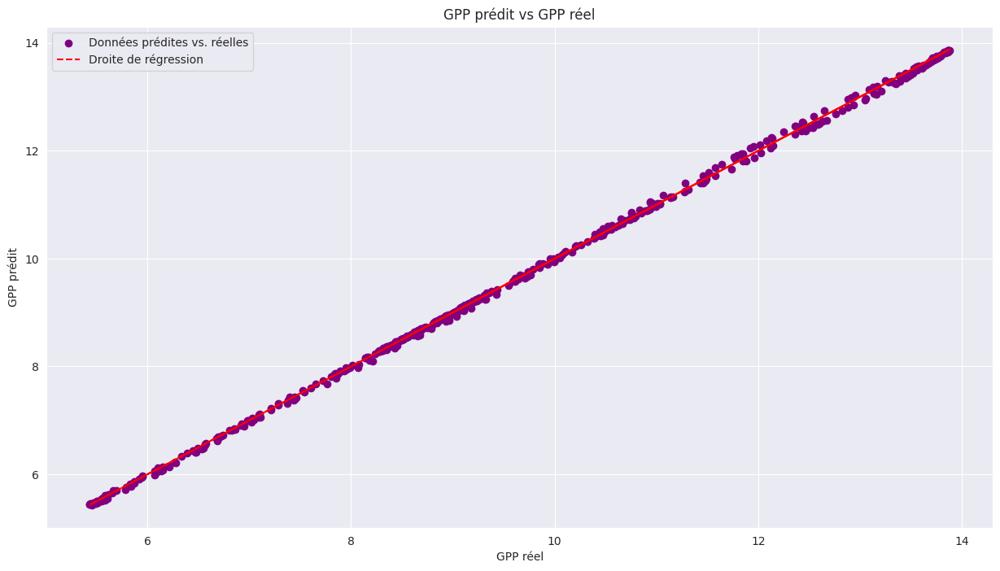

In [ ]:
# Erreur sur la composante annuelle
# lr=0.0001

predicted_lstm_ann, gold_lstm_ann = get_predictions(best_lstm_ann,test_loader,ann=True,anom=False)

plt.figure(figsize=(15,8))
plt.scatter(gold_lstm_ann, predicted_lstm_ann, color='purple', label='Données prédites vs réelles')

plt.plot(gold_lstm_ann, gold_lstm_ann, color='red', linestyle='--', label='Droite de régression')

plt.title('GPP prédit annuel vs GPP réel')
plt.xlabel('GPP réel')
plt.ylabel('GPP prédit')
plt.legend()
plt.show()

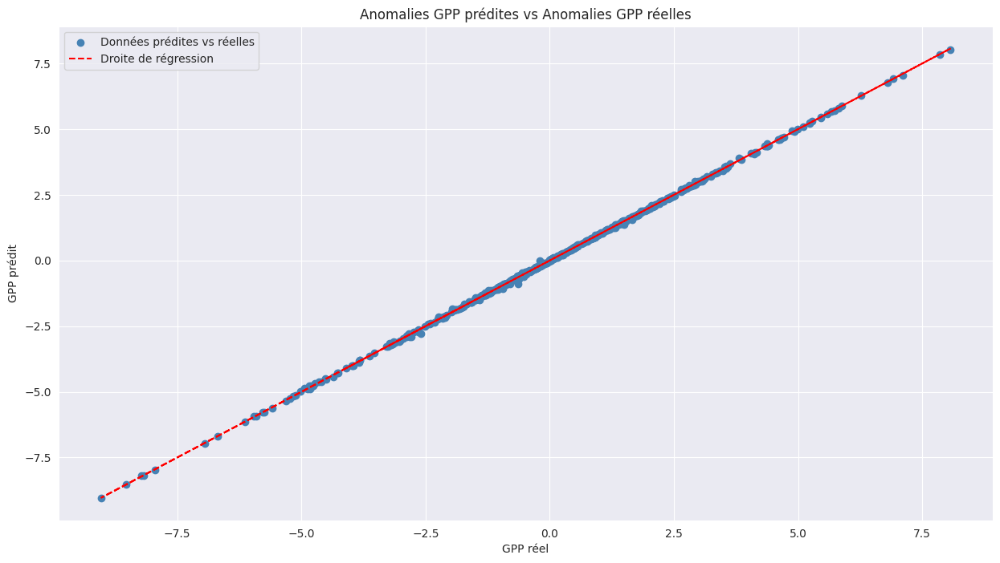

In [ ]:
# Erreur sur les anomalies
# lr=0.0001

predicted_lstm_anomalies, gold_lstm_anomalies = get_predictions(best_lstm_anomalies,test_loader,ann=False,anom=True)

plt.figure(figsize=(15,8))
plt.scatter(gold_lstm_anomalies, predicted_lstm_anomalies, color='steelblue', label='Données prédites vs réelles')

plt.plot(gold_lstm_anomalies, gold_lstm_anomalies, color='red', linestyle='--', label='Droite de régression')

plt.title('Anomalies GPP prédites vs Anomalies GPP réelles')
plt.xlabel('GPP réel')
plt.ylabel('GPP prédit')
plt.legend()
plt.show()

## Integrated gradients

In [ ]:
def compute_gradients(inp,model,compo_idx=1):

    inp.requires_grad_() # pyorch's automatic differentiation
    out = model(inp)
    out = out[:,compo_idx] #=1 pour les anomalies, en gros le modèle génère 3 valeurs
    out = out.sum()
    out.backward()
    return inp.grad


def integrated_gradients(inputs, model, background=None, steps=100):

    if background is None: # entrée de référence (baseline)
        background = torch.zeros_like(inputs)

    elif background.shape[0]!=1: # si background contient bcp de séqs
        background = torch.mean(background,0).unsqueeze(0)

    background=background.to(device)
    delta = (inputs - background)/steps
    integrated_gradients_vect = torch.zeros_like(inputs).to(device) #init

    for i in range(steps+1):
        interpolated_inp = background + i*delta
        gradients = compute_gradients(interpolated_inp, model)
        integrated_gradients_vect += gradients
    integrated_gradients_vect *=delta

    return integrated_gradients_vect

In [ ]:
def generate_background(df, day_idx, num_sequences=10, window_size=400):

    """
    Fonction pour générer des séquences de window_size éléments avant une observation donnée

    Retourne :
    - sequences : np array qui contient les séqs générées
    """

    sequences = []
    while day_idx>=365:
      for i in range(num_sequences):
          if day_idx >= window_size:
              sequence = df.iloc[day_idx-window_size:day_idx].values.tolist()
              sequences.append(sequence)
          #else:
              #print(f"Impo de générer la séquence {i+1}, po assez d'éléms avant 'xt'.")

          day_idx-=1 # reculer
      day_idx-=365-num_sequences

    sequences = np.array(sequences)

    return torch.from_numpy(sequences).float().to(device)

In [ ]:
def get_background_1day(df,day_idx,name_var,num_sequences=10,window_size=400):

  var_values=[]
  while day_idx>=365:
    for i in range(num_sequences):
      if day_idx >= window_size:
        var_value = df.iloc[day_idx-1][name_var]
        var_values.append(var_value)
      #else:
        #raise ValueError(f"Impo de générer la séquence {i+1}, po assez d'éléms avant 'xt'.")
      day_idx-=1
    day_idx-=365-num_sequences

  return np.mean(var_values)

In [ ]:
def values_plot_background(df,first_day_idx,last_day_idx,name_var,num_sequences=10,window_size=400):

  """
  Fonction pour plotter le background d'une variable donnée
  """

  all_var_values=[]
  day_indices=list(range(first_day_idx,last_day_idx+1))
  for day_idx in day_indices:
    var_values=[]
    while day_idx>=365:
      for i in range(num_sequences):
        if day_idx >= window_size:
          var_value = df.iloc[day_idx-1][name_var]
          var_values.append(var_value)
      #else:
        #raise ValueError(f"Impo de générer la séquence {i+1}, po assez d'éléms avant 'xt'.")
        day_idx-=1
      day_idx-=365-num_sequences
    all_var_values.append(np.mean(var_values))
  return all_var_values

### Heatmaps

In [ ]:
def integrated_gradients_predictions(sequence, window_size, model, first_day_idx, df_background, ann=False, anom=True, noise=False,integ_grad=True, vals_to_explain=31, background=None, steps=100):

    """
    Fonction qui retourne les gradients intégrés à partir des prédictions du modèle
    """

    mysequence = sequence.copy()
    integ_grads = []

    for i in range(mysequence.shape[1]-window_size):
        window = mysequence[:,i:i+window_size,:]

        # Prédire avec le modèle entraîné
        window_tensor = torch.from_numpy(window).float().to(device)

        pred = model(window_tensor)
        pred = pred.detach().cpu().numpy()

        if ann and integ_grad:
            mysequence[:,i+window_size,0] = pred[0][0]  # Remplacer la valeur réelle par celle prédite en forçant le reste des entrées
            last_pred_index = mysequence.shape[1]-window_size-vals_to_explain
            day_idx=first_day_idx
            if i >= last_pred_index:
                background=generate_background(df_background, day_idx, num_sequences=10, window_size=400)
                integrated_grad = integrated_gradients(window_tensor, model, background=background, steps=steps)
                integ_grads.append(integrated_grad)
                day_idx+=1

        if anom and integ_grad:
            mysequence[:,i+window_size,1] = pred[0][1]
            last_pred_index = mysequence.shape[1]-window_size-vals_to_explain
            day_idx=first_day_idx
            if i >= last_pred_index:
                background=generate_background(df_background, day_idx, num_sequences=10, window_size=400)
                integrated_grad = integrated_gradients(window_tensor, model, background=background, steps=steps)
                integ_grads.append(integrated_grad)
                day_idx+=1

        if noise and integ_grad:
            mysequence[:,i+window_size,2] = pred[0][2]
            last_pred_index = mysequence.shape[1]-window_size-vals_to_explain
            day_idx=first_day_idx
            if i >= last_pred_index:
                background=generate_background(df_background, day_idx, num_sequences=10, window_size=400)
                integrated_grad = integrated_gradients(window_tensor, model, background=background, steps=steps)
                integ_grads.append(integrated_grad)
                day_idx+=1

    if (ann and integ_grad) or (anom and integ_grad) or (noise and integ_grad):
        ig = [grad.cpu().numpy() for grad in integ_grads]
        return np.array(ig).squeeze()

In [ ]:
##################### test 15 avril => 15 octobre 2022 ##########################################

####################### GPP annuel #################################

best_lstm_ann=torch.load(get_path('best_lstm_ann_0.0001_ss_gpp_time','lstm'))
best_lstm_ann.to(device)

first_day_idx=data[(data['DateTime'].dt.year==2022) & (data['DateTime'].dt.month==4) & (data['DateTime'].dt.day==15)].index[0]

window_size=400
val_to_pred=184
seq_len_day=window_size*2+val_to_pred # 400+184 jours à prédire (soit 6mois)
seq_data_day = df.loc[first_day_idx-window_size*2:first_day_idx+val_to_pred+1]
seq_day, _ = inputs_outputs(seq_len_day, seq_data_day, data_ss_gpp_time)
print(seq_day.shape)

ann_integrated_gradients_6months=integrated_gradients_predictions(seq_day, window_size, best_lstm_ann, first_day_idx,data_ss_gpp_time, ann=True, anom=False, noise=False,integ_grad=True, vals_to_explain=184, steps=100)

(1, 984, 8)


In [ ]:
##################### test 15 avril => 15 octobre 2022 ##########################################

####################### Noise #################################

first_day_idx=data[(data['DateTime'].dt.year==2022) & (data['DateTime'].dt.month==4) & (data['DateTime'].dt.day==15)].index[0]

window_size=400
val_to_pred=184
seq_len_day=window_size*2+val_to_pred # 400+184 jours à prédire (soit 6mois)
seq_data_day = df.loc[first_day_idx-window_size*2:first_day_idx+val_to_pred+1]
seq_day, _ = inputs_outputs(seq_len_day, seq_data_day, data_ss_gpp_time)
print(seq_day.shape)

noise_integrated_gradients_6months=integrated_gradients_predictions(seq_day, window_size, best_lstm_noise, first_day_idx, data_ss_gpp_time,ann=False, anom=False, noise=True,integ_grad=True, vals_to_explain=184, steps=100)
print(noise_integrated_gradients_6months.shape)

(1, 984, 8)


---------------------------------

In [ ]:
##################### test 15 avril => 15 octobre 2022 ##########################################

####################### Anomalies #################################

best_lstm_anomalies=torch.load(get_path('best_lstm_anomalies_0.0001_ss_gpp_time','lstm'))
best_lstm_anomalies.to(device)

first_day_idx=data[(data['DateTime'].dt.year==2022) & (data['DateTime'].dt.month==4) & (data['DateTime'].dt.day==15)].index[0]
last_day_idx = data[(data['DateTime'].dt.month==10) & (data['DateTime'].dt.year==2022) & (data['DateTime'].dt.day==15)].index[0]

window_size=400
val_to_pred=len(data_ss_gpp_time[first_day_idx:last_day_idx+1])
seq_len_day=window_size*2+val_to_pred # 400+184 jours à prédire (soit 6mois)
seq_data_day = df.loc[first_day_idx-window_size*2:first_day_idx+val_to_pred+1]
seq_day, _ = inputs_outputs(seq_len_day, seq_data_day, data_ss_gpp_time)
print(seq_day.shape)

anom_integrated_gradients_6months=integrated_gradients_predictions(seq_day, window_size, best_lstm_anomalies, first_day_idx, data_ss_gpp_time,ann=False, anom=True, noise=False,integ_grad=True, vals_to_explain=184, steps=100)
print(anom_integrated_gradients_6months.shape)

(1, 984, 8)
(184, 400, 8)


In [ ]:
##################### test 1 Janvier => 15 octobre 2022 ##########################################

####################### Anomalies #################################

####################### Charger le modèle entrainé et récupérer les séquences #################################


best_lstm_anomalies=torch.load(get_path('best_lstm_anomalies_0.0001_ss_gpp_time','lstm'))
best_lstm_anomalies.to(device)

first_day_idx=data[(data['DateTime'].dt.year==2022) & (data['DateTime'].dt.month==1) & (data['DateTime'].dt.day==1)].index[0]
last_day_idx = data[(data['DateTime'].dt.month==10) & (data['DateTime'].dt.year==2022) & (data['DateTime'].dt.day==15)].index[0]

window_size=400
val_to_pred=len(data_ss_gpp_time[first_day_idx:last_day_idx+1])
seq_len_day=window_size*2+val_to_pred # 400+jours à prédire (soit 10mois)
seq_data_day = df.loc[first_day_idx-window_size*2:first_day_idx+val_to_pred+1]
seq_day, _ = inputs_outputs(seq_len_day, seq_data_day, data_ss_gpp_time)
print(seq_day.shape)

anom_integrated_gradients_10months=integrated_gradients_predictions(seq_day, window_size, best_lstm_anomalies, first_day_idx, data_ss_gpp_time,ann=False, anom=True, noise=False,integ_grad=True, vals_to_explain=val_to_pred, steps=100)
print(anom_integrated_gradients_10months.shape)

(1, 1088, 8)
(288, 400, 8)


#### Box plots

In [ ]:
"""
contribution de chaque feature, distribution des sensibilités
"""

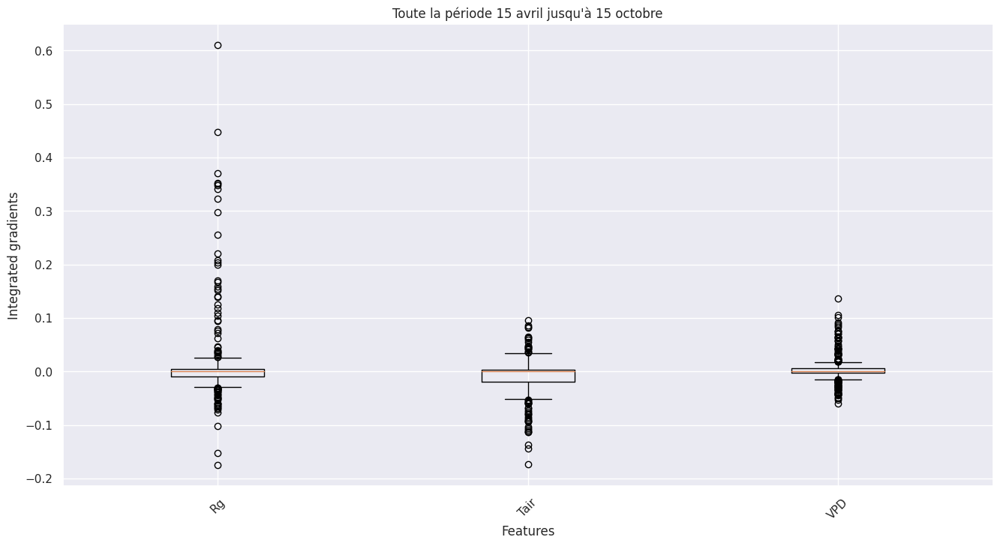

In [ ]:
##################### 15 avril => 15 octobre 2022 ##########################################

plt.figure(figsize=(16,8))
mean_anom_integrated_gradients_6months=anom_integrated_gradients_6months[:,:,:3].mean(axis=0)
plt.boxplot(mean_anom_integrated_gradients_6months)

plt.xlabel('Features')
plt.ylabel('Integrated gradients')
plt.title("Toute la période 15 avril jusqu'à 15 octobre")
features=data_ss_gpp_time.columns.tolist()[:3]
plt.xticks(range(1,len(features)+1),features,rotation=45)

plt.show()

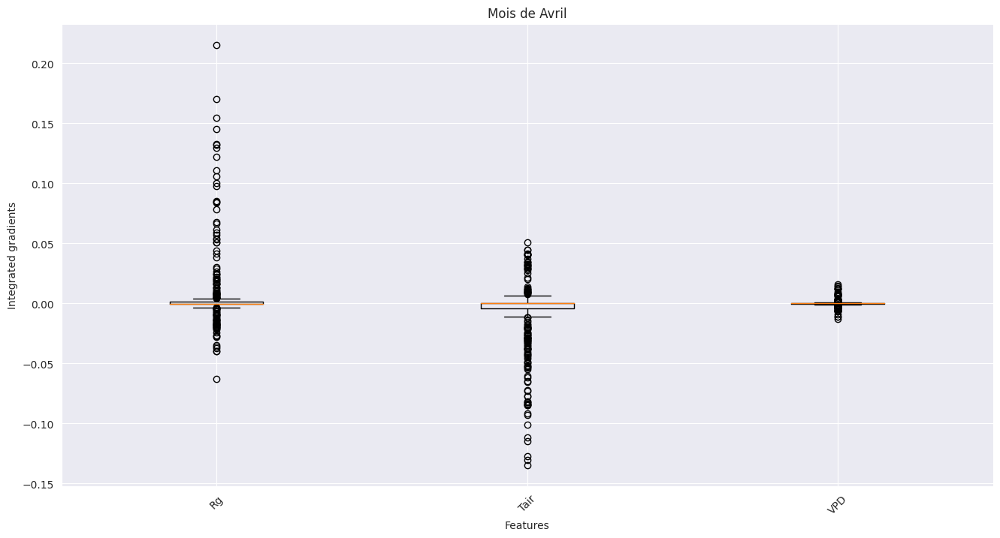

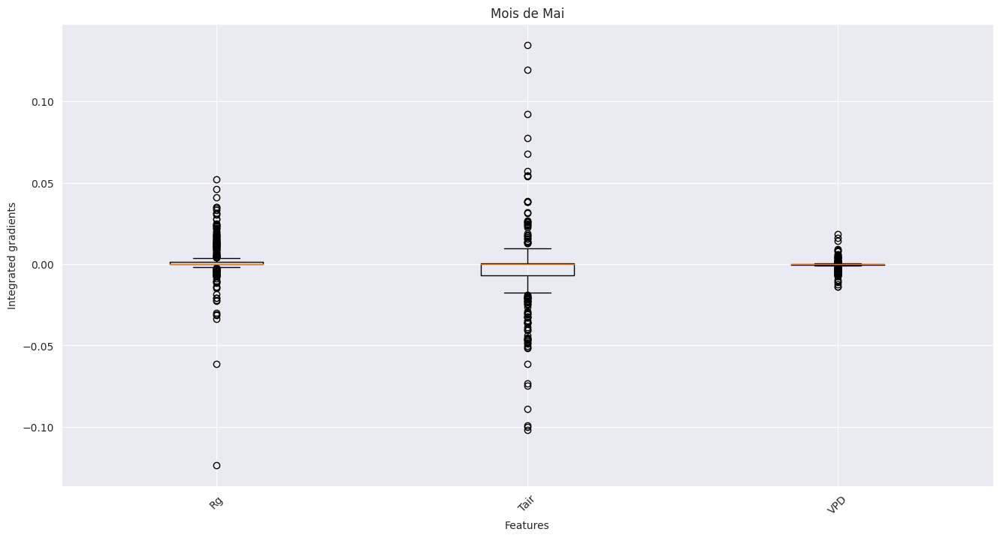

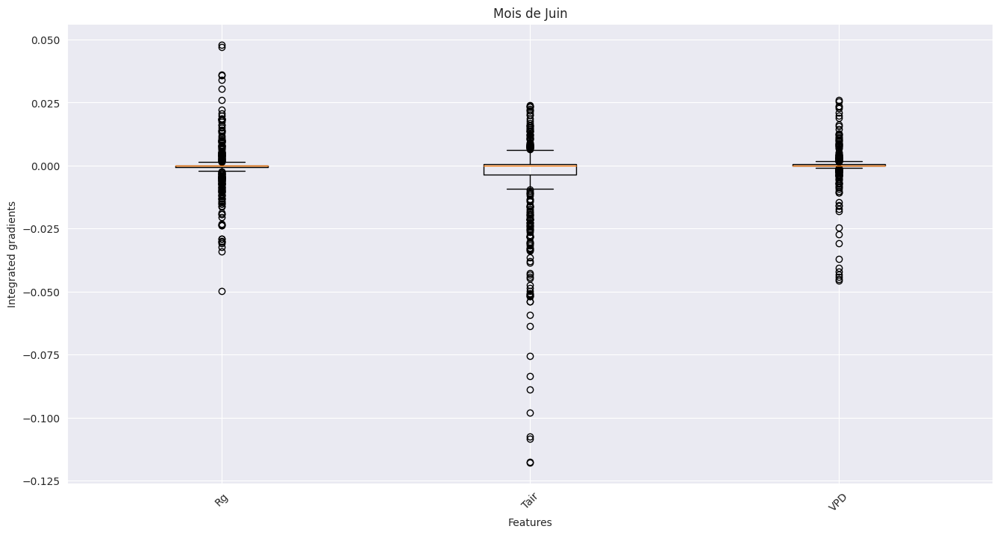

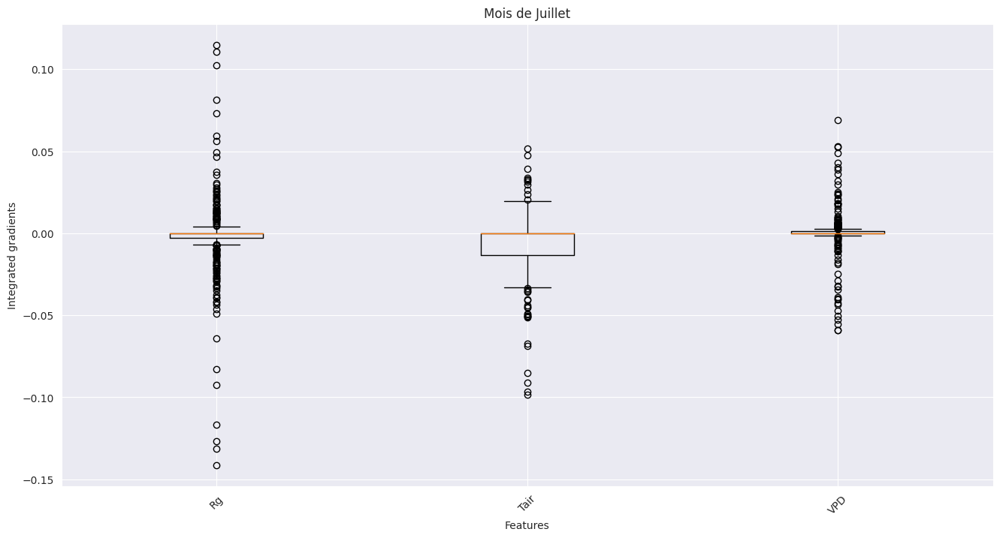

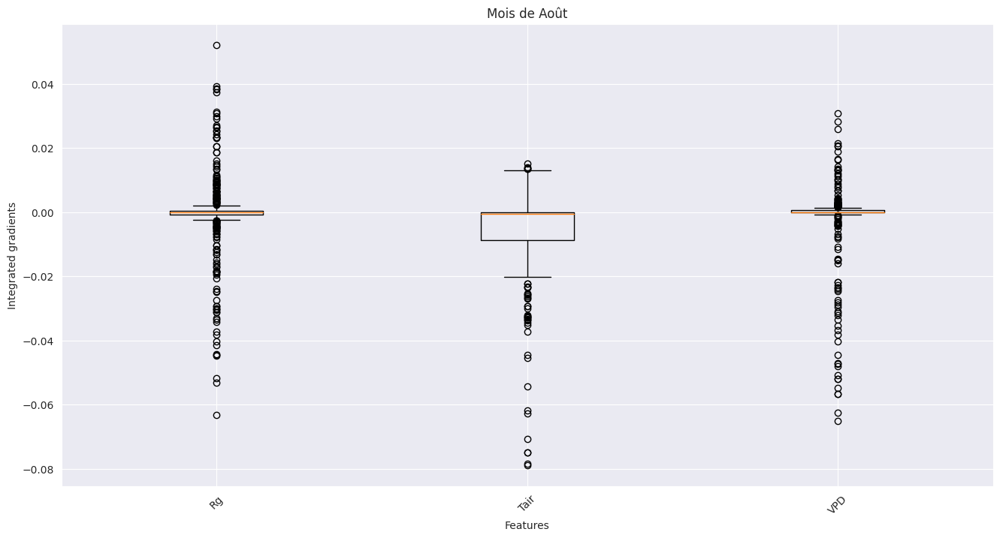

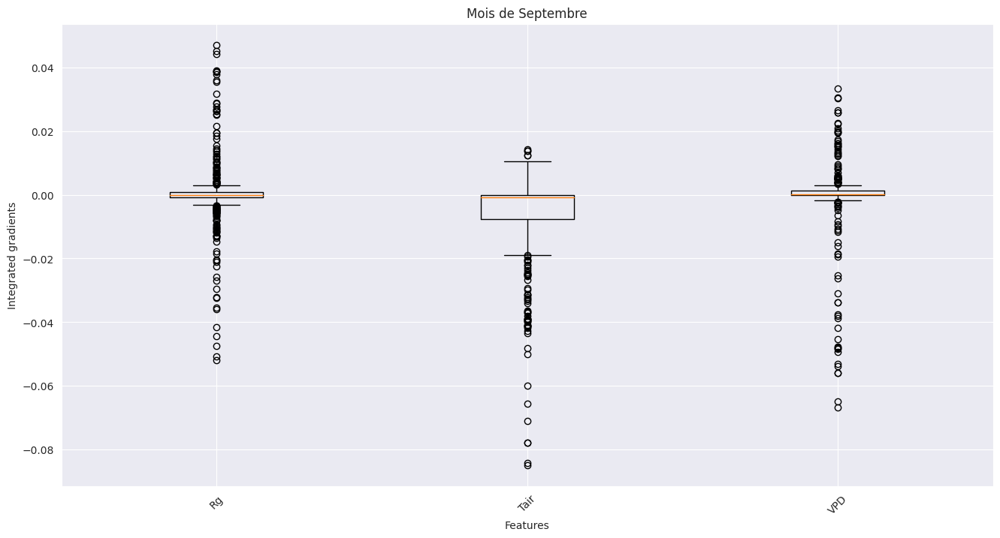

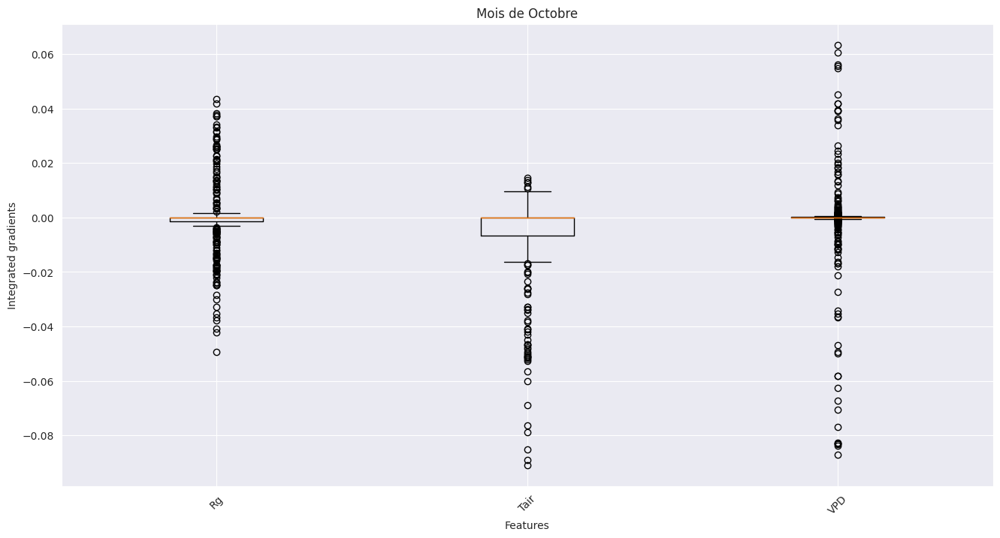

In [ ]:
##################### Avril 2022 ##########################################

plt.figure(figsize=(16,8))
mean_anom_integrated_gradients_avril=anom_integrated_gradients_6months[:16,:,:3].mean(axis=0)
plt.boxplot(mean_anom_integrated_gradients_avril)
plt.xlabel('Features')
plt.ylabel('Integrated gradients')
plt.title("Mois de Avril")
plt.xticks(range(1,len(features)+1),features,rotation=45)
plt.show()

##################### Mai 2022 ##########################################

plt.figure(figsize=(16,8))
mean_anom_integrated_gradients_mai=anom_integrated_gradients_6months[16:16+31,:,:3].mean(axis=0)
plt.boxplot(mean_anom_integrated_gradients_mai)
plt.xlabel('Features')
plt.ylabel('Integrated gradients')
plt.title("Mois de Mai")
plt.xticks(range(1,len(features)+1),features,rotation=45)

##################### Juin 2022 ##########################################

plt.figure(figsize=(16,8))
mean_anom_integrated_gradients_juin=anom_integrated_gradients_6months[16+31:16+31+30,:,:3].mean(axis=0)
plt.boxplot(mean_anom_integrated_gradients_juin)
plt.xlabel('Features')
plt.ylabel('Integrated gradients')
plt.title("Mois de Juin")
plt.xticks(range(1,len(features)+1),features,rotation=45)

##################### Juillet 2022 ##########################################

plt.figure(figsize=(16,8))
mean_anom_integrated_gradients_juillet=anom_integrated_gradients_6months[16+31+30:16+31+30+31,:,:3].mean(axis=0)
plt.boxplot(mean_anom_integrated_gradients_juillet)
plt.xlabel('Features')
plt.ylabel('Integrated gradients')
plt.title("Mois de Juillet")
plt.xticks(range(1,len(features)+1),features,rotation=45)
plt.show()

##################### Août 2022 ##########################################

plt.figure(figsize=(16,8))
mean_anom_integrated_gradients_aout=anom_integrated_gradients_6months[16+31+30+31:16+31+30+31+31,:,:3].mean(axis=0)
plt.boxplot(mean_anom_integrated_gradients_aout)
plt.xlabel('Features')
plt.ylabel('Integrated gradients')
plt.title("Mois de Août")
plt.xticks(range(1,len(features)+1),features,rotation=45)
plt.show()

##################### Septembre 2022 ##########################################

plt.figure(figsize=(16,8))
mean_anom_integrated_gradients_sept=anom_integrated_gradients_6months[16+31+30+31+31:16+31+30+31+31+30,:,:3].mean(axis=0)
plt.boxplot(mean_anom_integrated_gradients_sept)
plt.xlabel('Features')
plt.ylabel('Integrated gradients')
plt.title("Mois de Septembre")
plt.xticks(range(1,len(features)+1),features,rotation=45)
plt.show()

##################### Octobre 2022 ##########################################

plt.figure(figsize=(16,8))
mean_anom_integrated_gradients_oct=anom_integrated_gradients_6months[16+31+30+31+31+30:,:,:3].mean(axis=0)
plt.boxplot(mean_anom_integrated_gradients_oct)
plt.xlabel('Features')
plt.ylabel('Integrated gradients')
plt.title("Mois de Octobre")
plt.xticks(range(1,len(features)+1),features,rotation=45)
plt.show()

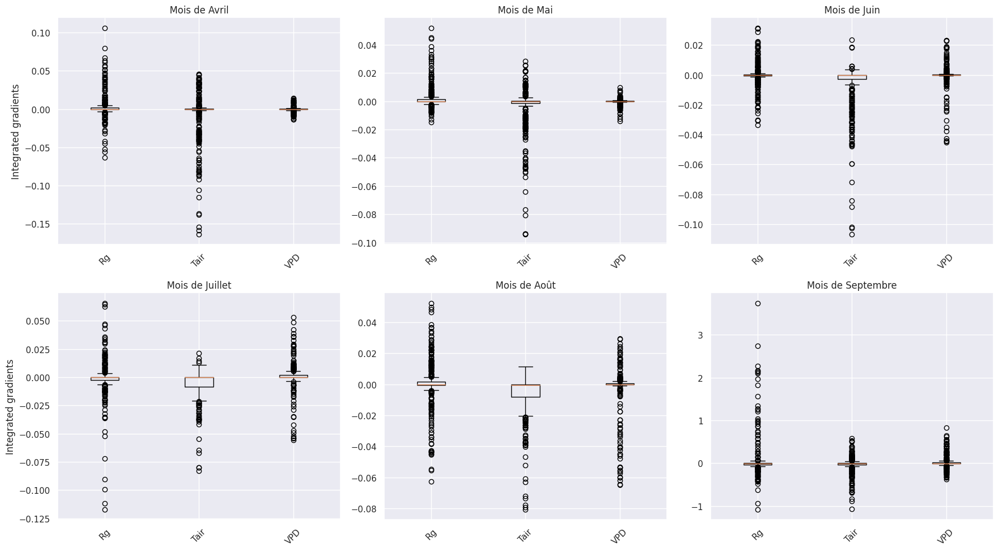

In [ ]:
months_data = [anom_integrated_gradients_6months[:16,:,:3].mean(axis=0),
anom_integrated_gradients_6months[16:16+31,:,:3].mean(axis=0),
    anom_integrated_gradients_6months[16+31:16+31+30,:,:3].mean(axis=0),
    anom_integrated_gradients_6months[16+31+30:16+31+30+31,:,:3].mean(axis=0),
    anom_integrated_gradients_6months[16+31+30+31:16+31+30+31+31,:,:3].mean(axis=0),
    anom_integrated_gradients_6months[16+31+30+31+31:16+31+30+31+31+30,:,:3].mean(axis=0),
    anom_integrated_gradients_6months[16+31+30+31+31+30:,:,:3].mean(axis=0)]

months=["Avril","Mai","Juin","Juillet","Août","Septembre","Octobre"]

fig,axes = plt.subplots(nrows=2,ncols=3,figsize=(18,10))
axes=axes.flatten()

for i, ax in enumerate(axes):
    #if i>=len(months_data):
      #break
    ax.boxplot(months_data[i])
    #ax.set_xlabel('Features')
    #ax.set_ylabel('Integrated gradients')
    #ax.set_yticklabels([])
    ax.set_title(f"Mois de {months[i]}")
    ax.set_xticks(range(1,len(features)+1))
    ax.set_xticklabels(features,rotation=45)

axes[0].set_ylabel('Integrated gradients')
axes[3].set_ylabel('Integrated gradients')

plt.show()

In [ ]:
def get_var_values(var_name,data=data,start_date='2022-04-15',end_date='2022-10-15'):

  range_values_6months=data[(data['DateTime']>=start_date) & (data['DateTime']<=end_date)]
  var_values=range_values_6months[var_name].tolist()

  return var_values

In [ ]:
import matplotlib.gridspec as gs
plt.ion()

#### Résultats sur 6 mois (Avril => Octobre)
- Sans convolution

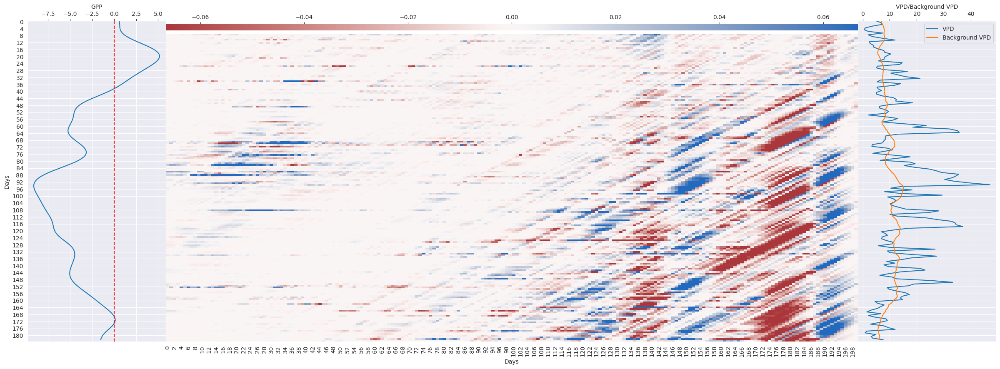

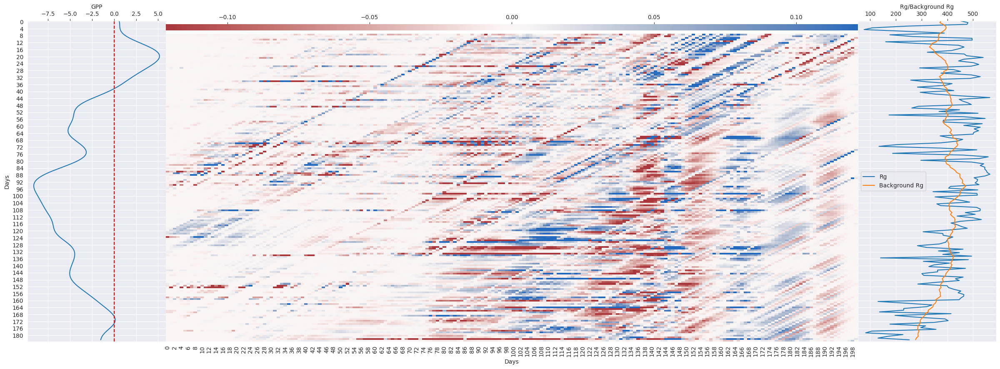

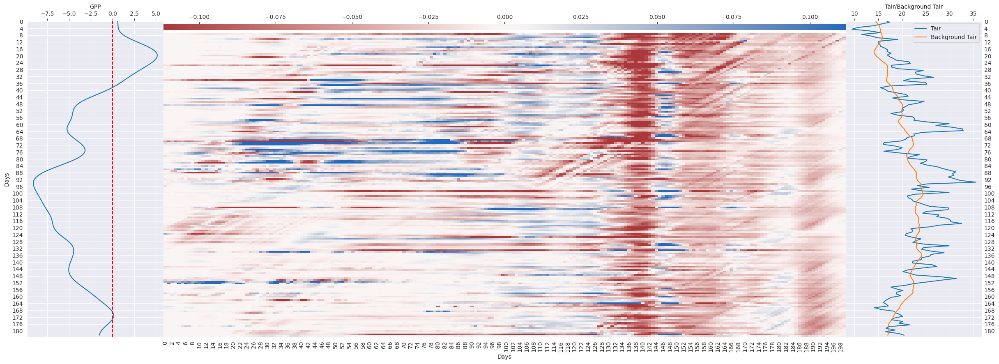

In [ ]:
##################### test 15 avril => 15 octobre 2022 ##########################################

####################### Sans Conv #################################

range_values_6months=data[(data['DateTime']>='2022-04-15') & (data['DateTime']<='2022-10-15')]
L=len(range_values_6months)
first_day_idx=data[(data['DateTime'].dt.year==2022) & (data['DateTime'].dt.month==4) & (data['DateTime'].dt.day==15)].index[0]
last_day_idx = data[(data['DateTime'].dt.month==10) & (data['DateTime'].dt.year==2022) & (data['DateTime'].dt.day==15)].index[0]
N=200
y_range=range(0,L)

####################### Anomalies GPP/VPD #################################

vpd_gradients=anom_integrated_gradients_6months[:,-N:,2]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_vpd=vpd_gradients.std()
sns.heatmap(vpd_gradients,ax=ax2,center=0,vmin=-2*std_vpd,vmax=2*std_vpd,cmap=reversed_palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('VPD'),y_range,label='VPD')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'VPD'),y_range,label='Background VPD')
ax3.set_xlabel("VPD/Background VPD")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
plt.show()

###########################################################################################################

####################### Anomalies GPP/Rg #################################

rg_gradients=anom_integrated_gradients_6months[:,-N:,0]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_rg=rg_gradients.std()
sns.heatmap(rg_gradients,ax=ax2,center=0,vmin=-2*std_rg,vmax=2*std_rg,cmap=reversed_palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Rg'),y_range,label='Rg')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Rg'),y_range,label='Background Rg')
ax3.set_xlabel("Rg/Background Rg")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
plt.show()

###########################################################################################################

####################### Anomalies GPP/Tair #################################

tair_gradients=anom_integrated_gradients_6months[:,-N:,1]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params={'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_tair=tair_gradients.std()
sns.heatmap(tair_gradients,ax=ax2,center=0,vmin=-2*std_tair,vmax=2*std_tair,cmap=reversed_palette,cbar_kws=cbar_params)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Tair'),y_range,label='Tair')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Tair'),y_range,label='Background Tair')
ax3.set_xlabel("Tair/Background Tair")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
plt.show()

# déviation = variable à l'état actuel - background
# GPP>0 et déviation>0 VS GPP>0 et déviation<0

# GPP<0 et déviation>0 VS GPP<0 et déviation<0


- Avec convolution

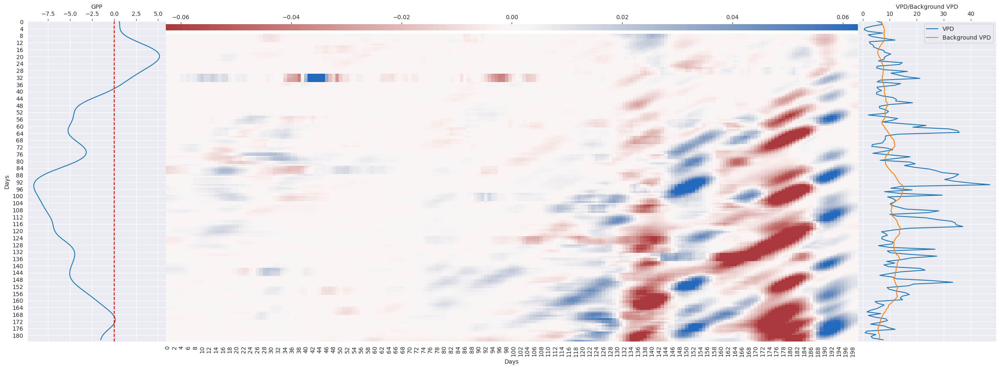

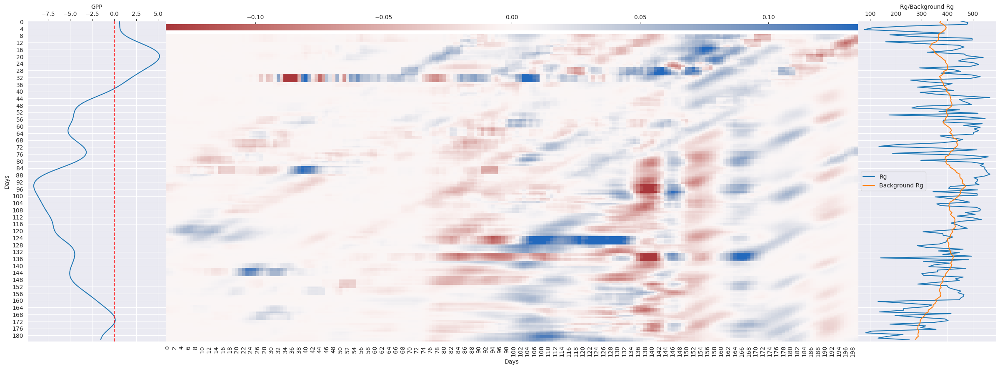

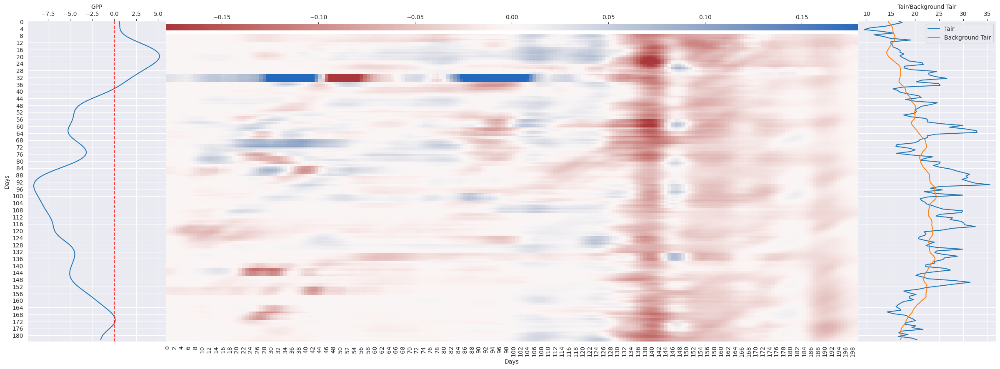

In [ ]:
##################### test 15 avril => 15 octobre 2022 ##########################################

range_values_6months=data[(data['DateTime']>='2022-04-15') & (data['DateTime']<='2022-10-15')]
L=len(range_values_6months)
first_day_idx=data[(data['DateTime'].dt.year==2022) & (data['DateTime'].dt.month==4) & (data['DateTime'].dt.day==15)].index[0]
last_day_idx = data[(data['DateTime'].dt.month==10) & (data['DateTime'].dt.year==2022) & (data['DateTime'].dt.day==15)].index[0]
N=200
y_range=range(0,L)

####################### Avec Conv #################################

import scipy.ndimage as sc
n=5
f=np.ones((n,n))/n**2

####################### Anomalies GPP/VPD #################################

vpd_gradients=anom_integrated_gradients_6months[:,-N:,2]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_vpd=vpd_gradients.std()
sns.heatmap(sc.convolve(vpd_gradients,f),ax=ax2,center=0,vmin=-2*std_vpd,vmax=2*std_vpd,cmap=reversed_palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('VPD'),y_range,label='VPD')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'VPD'),y_range,label='Background VPD')
ax3.set_xlabel("VPD/Background VPD")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
plt.show()

###########################################################################################################

####################### Anomalies GPP/Rg #################################

rg_gradients=anom_integrated_gradients_6months[:,-N:,0]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_rg=rg_gradients.std()
sns.heatmap(sc.convolve(rg_gradients,f),ax=ax2,center=0,vmin=-2*std_rg,vmax=2*std_rg,cmap=reversed_palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Rg'),y_range,label='Rg')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Rg'),y_range,label='Background Rg')
ax3.set_xlabel("Rg/Background Rg")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
plt.show()

###########################################################################################################

####################### Anomalies GPP/Tair #################################

tair_gradients=anom_integrated_gradients_6months[:,-N:,1]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params={'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_tair=tair_gradients.std()
sns.heatmap(sc.convolve(tair_gradients,f),ax=ax2,center=0,vmin=-2*std_tair,vmax=2*std_tair,cmap=reversed_palette,cbar_kws=cbar_params)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Tair'),y_range,label='Tair')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Tair'),y_range,label='Background Tair')
ax3.set_xlabel("Tair/Background Tair")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
plt.show()

#### Résultats sur 10 mois (Janvier => Octobre)

In [ ]:
def generate_date_labels(start_date=datetime(2022,1,1),end_date=datetime(2022,10,15)):
  date_labels=[]
  current_date=start_date
  while current_date<=end_date:
      #date_labels.append(current_date.strftime("%Y-%m-%d"))
      date_labels.append(current_date.strftime("%b"))
      current_date+=timedelta(days=1)
  return date_labels,[i for i,month in enumerate(date_labels) if month!=date_labels[i-1]]

In [ ]:
date_labels,date_ticks=generate_date_labels()

- Sans convolution

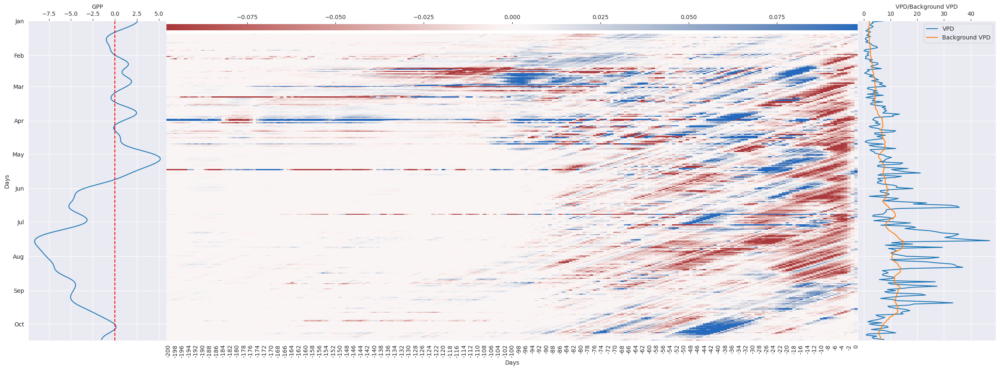

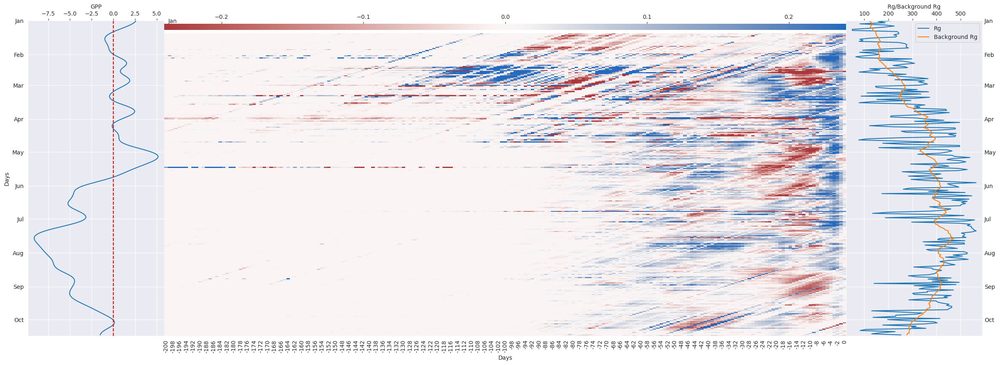

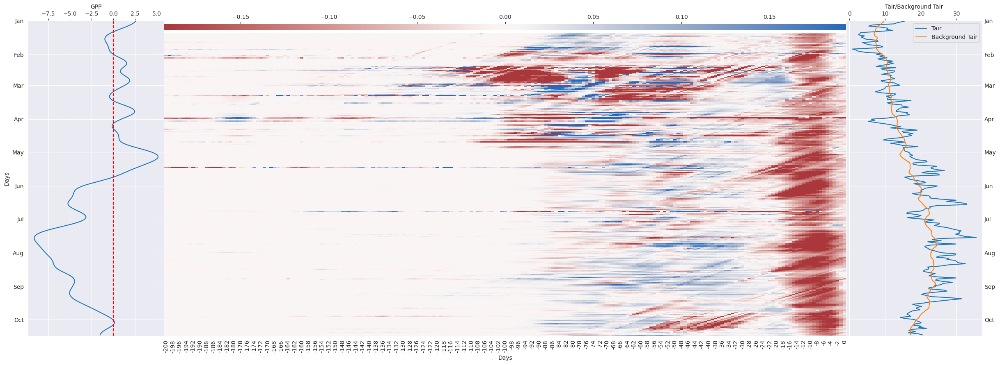

In [ ]:
##################### 1 Janvier => 15 octobre 2022 ##########################################

####################### Sans Conv #################################

range_values_10months=data[(data['DateTime']>='2022-01-01') & (data['DateTime']<='2022-10-15')]
L=len(range_values_10months)
first_day_idx=data[(data['DateTime'].dt.year==2022) & (data['DateTime'].dt.month==1) & (data['DateTime'].dt.day==1)].index[0]
last_day_idx = data[(data['DateTime'].dt.month==10) & (data['DateTime'].dt.year==2022) & (data['DateTime'].dt.day==15)].index[0]
N=200+1
y_range=range(0,L)

####################### Anomalies GPP/VPD #################################

vpd_gradients=anom_integrated_gradients_10months[:,-N:,2]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_vpd=vpd_gradients.std()
sns.heatmap(vpd_gradients,ax=ax2,center=0,vmin=-2*std_vpd,vmax=2*std_vpd,cmap=reversed_palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
rev_ticks=np.arange(-200,1,step=2)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('VPD',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range,label='VPD')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'VPD'),y_range,label='Background VPD')
ax3.set_xlabel("VPD/Background VPD")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
plt.show()

###########################################################################################################

####################### Anomalies GPP/Rg #################################

rg_gradients=anom_integrated_gradients_10months[:,-N:,0]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_rg=rg_gradients.std()
sns.heatmap(rg_gradients,ax=ax2,center=0,vmin=-2*std_rg,vmax=2*std_rg,cmap=reversed_palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Rg',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range,label='Rg')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Rg'),y_range,label='Background Rg')
ax3.set_xlabel("Rg/Background Rg")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
plt.show()

###########################################################################################################

####################### Anomalies GPP/Tair #################################

tair_gradients=anom_integrated_gradients_10months[:,-N:,1]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params={'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_tair=tair_gradients.std()
sns.heatmap(tair_gradients,ax=ax2,center=0,vmin=-2*std_tair,vmax=2*std_tair,cmap=reversed_palette,cbar_kws=cbar_params)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Tair',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range,label='Tair')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Tair'),y_range,label='Background Tair')
ax3.set_xlabel("Tair/Background Tair")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
plt.show()

- Avec convolution

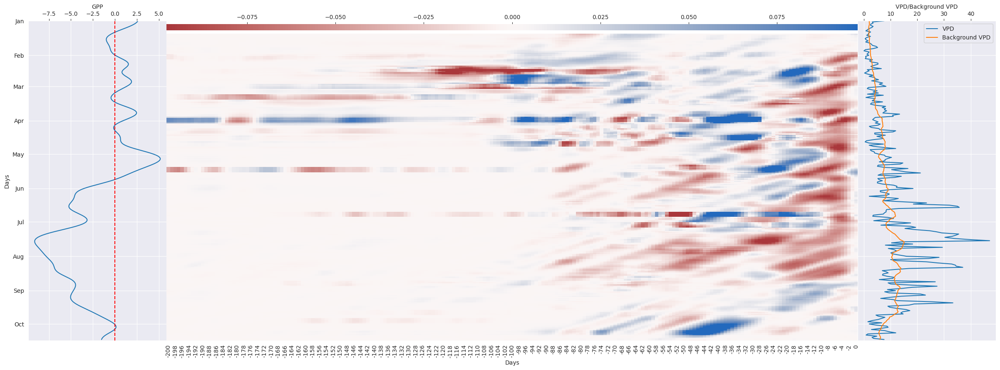

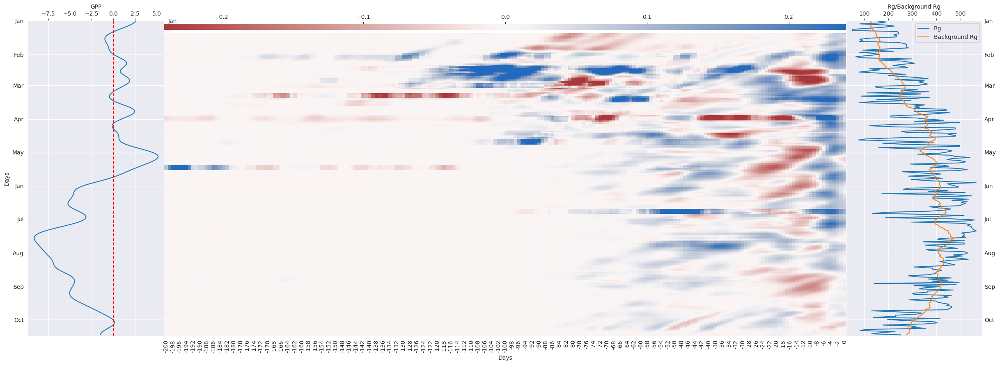

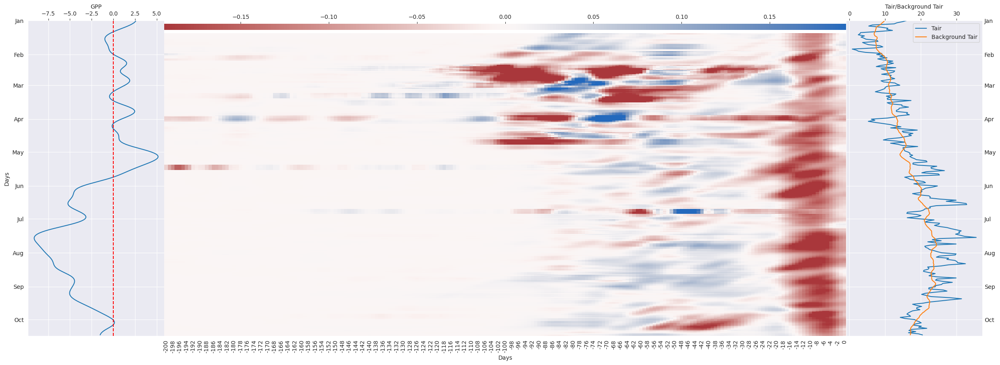

In [ ]:
##################### 1 Janvier => 15 octobre 2022 ##########################################

range_values_10months=data[(data['DateTime']>='2022-01-01') & (data['DateTime']<='2022-10-15')]
L=len(range_values_10months)
first_day_idx=data[(data['DateTime'].dt.year==2022) & (data['DateTime'].dt.month==1) & (data['DateTime'].dt.day==1)].index[0]
last_day_idx=data[(data['DateTime'].dt.month==10) & (data['DateTime'].dt.year==2022) & (data['DateTime'].dt.day==15)].index[0]
N=200+1
y_range=range(0,L)

####################### Avec Conv #################################

import scipy.ndimage as sc
n=5
f=np.ones((n,n))/n**2

####################### Anomalies GPP/VPD #################################

vpd_gradients=anom_integrated_gradients_10months[:,-N:,2]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_vpd=vpd_gradients.std()
sns.heatmap(sc.convolve(vpd_gradients,f),ax=ax2,center=0,vmin=-2*std_vpd,vmax=2*std_vpd,cmap=reversed_palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
rev_ticks=np.arange(-200,1,step=2)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('VPD',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range,label='VPD')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'VPD'),y_range,label='Background VPD')
ax3.set_xlabel("VPD/Background VPD")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
plt.show()

###########################################################################################################

####################### Anomalies GPP/Rg #################################

rg_gradients=anom_integrated_gradients_10months[:,-N:,0]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_rg=rg_gradients.std()
sns.heatmap(sc.convolve(rg_gradients,f),ax=ax2,center=0,vmin=-2*std_rg,vmax=2*std_rg,cmap=reversed_palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Rg',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range,label='Rg')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Rg'),y_range,label='Background Rg')
ax3.set_xlabel("Rg/Background Rg")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
plt.show()

###########################################################################################################

####################### Anomalies GPP/Tair #################################

tair_gradients=anom_integrated_gradients_10months[:,-N:,1]

fig = plt.figure(figsize=(30,10))
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2],sharey=ax1)
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params={'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_tair=tair_gradients.std()
sns.heatmap(sc.convolve(tair_gradients,f),ax=ax2,center=0,vmin=-2*std_tair,vmax=2*std_tair,cmap=reversed_palette,cbar_kws=cbar_params)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Tair',data=data,start_date='2022-01-01',end_date='2022-10-15'),y_range,label='Tair')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Tair'),y_range,label='Background Tair')
ax3.set_xlabel("Tair/Background Tair")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
plt.show()

##### Partie séparation des sensibilités (positives & négatives)

In [ ]:
import datetime as dt

In [ ]:
def separate_grads(var_gradients,var_name,start_date='2022-04-15',end_date='2022-10-15'):
  start_date=dt.date.fromisoformat(start_date)
  start_date=start_date+timedelta(days=var_gradients.shape[1])
  pstv_grad_var_vect=np.zeros_like(var_gradients)
  ngtv_grad_var_vect=np.zeros_like(var_gradients)
  var_background=values_plot_background(data,first_day_idx-var_gradients.shape[1],last_day_idx,var_name)
  start_date=start_date.isoformat()
  var_values=get_var_values(var_name,data=data,start_date=start_date,end_date=end_date)
  # déviation = variable à l'état actuel - background
  deviation=[var-bg for var,bg in zip(var_values,var_background)]
  for i,var_grad in enumerate(var_gradients):
    for j,var_grad_step in enumerate(var_grad):
      n=i-j+var_gradients.shape[1]-1
      # grad>0 et déviation>0 VS grad>0 et déviation<0
      if var_grad_step>0 and deviation[n]>0:
        pstv_grad_var_vect[i,j]=var_grad_step
      elif var_grad_step>0 and deviation[n]<0:
        pstv_grad_var_vect[i,j]=var_grad_step*-1
      # grad<0 et déviation>0 VS grad<0 et déviation<0
      elif (var_grad_step<0 and deviation[n]<0):
        ngtv_grad_var_vect[i,j]=var_grad_step
      elif (var_grad_step<0 and deviation[n]>0):
        ngtv_grad_var_vect[i,j]=var_grad_step*-1
  return pstv_grad_var_vect,ngtv_grad_var_vect

In [ ]:
var_gradients=anom_integrated_gradients_10months[:,:,2]
start_date,end_date='2022-04-15','2022-10-15'
# start_date=dt.date.fromisoformat(start_date)
# start_date=start_date-timedelta(days=var_gradients.shape[1])
start_date=dt.date.fromisoformat(end_date)-timedelta(days=(int(var_gradients.shape[1]+last_day_idx-first_day_idx+1)))
pstv_grad_var_vect=np.zeros_like(var_gradients)
ngtv_grad_var_vect=np.zeros_like(var_gradients)
var_name='VPD'
var_background=values_plot_background(data,first_day_idx-var_gradients.shape[1],last_day_idx,var_name)
print(len(var_background))
start_date=start_date.isoformat()
var_values=get_var_values(var_name,data=data,start_date=start_date,end_date=end_date)
print(dt.date.fromisoformat(end_date)-dt.date.fromisoformat(start_date))
print(len(var_values))
pstv_grad_var_vect,ngtv_grad_var_vect=np.zeros_like(var_gradients),np.zeros_like(var_gradients)
deviation=[var-bg for var,bg in zip(var_values,var_background)]
#deviation=list(reversed(deviation))
print(len(deviation))
for i,var_grad in enumerate(var_gradients):
  for j,var_grad_step in enumerate(var_grad):
    n=i-j+var_gradients.shape[1]-1
    #print(n)
    # # grad>0 et déviation>0 VS grad>0 et déviation<0
    # if var_grad_step>0 and deviation[n]>0:
    #   pstv_grad_var_vect[i,j]=var_grad_step
    # elif var_grad_step>0 and deviation[n]<0:
    #   pstv_grad_var_vect[i,j]=var_grad_step*-1
    # # grad<0 et déviation>0 VS grad<0 et déviation<0
    # elif (var_grad_step<0 and deviation[n]<0):
    #   ngtv_grad_var_vect[i,j]=var_grad_step*-1
    # elif (var_grad_step<0 and deviation[n]>0):
    #   ngtv_grad_var_vect[i,j]=var_grad_step

    # grad>0 et déviation>0 VS grad<0 et déviation<0
    if var_grad_step>0 and deviation[n]>0:
      pstv_grad_var_vect[i,j]=var_grad_step
    elif var_grad_step<0 and deviation[n]<0:
      pstv_grad_var_vect[i,j]=var_grad_step*-1
    # grad<0 et déviation>0 VS grad>0 et déviation<0
    elif (var_grad_step<0 and deviation[n]>0):
      ngtv_grad_var_vect[i,j]=var_grad_step
    elif (var_grad_step>0 and deviation[n]<0):
      ngtv_grad_var_vect[i,j]=var_grad_step*-1

688
688 days, 0:00:00
689
688


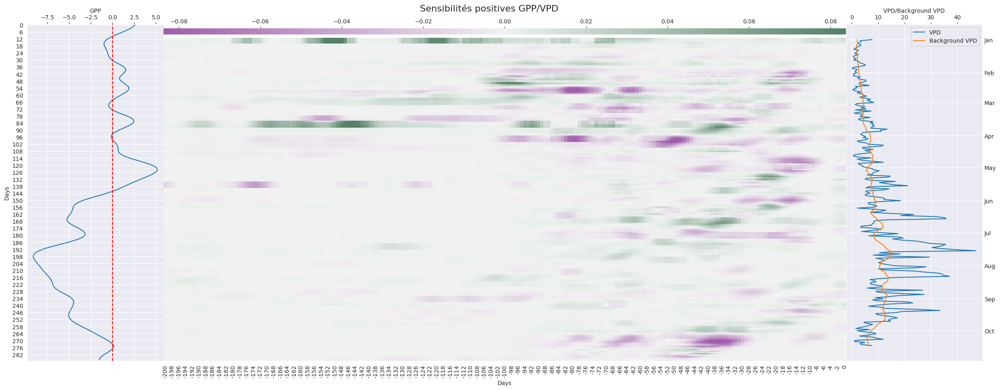

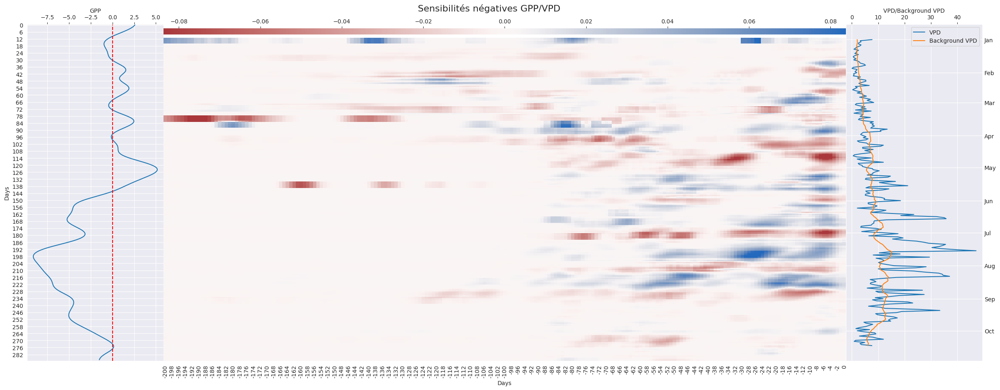

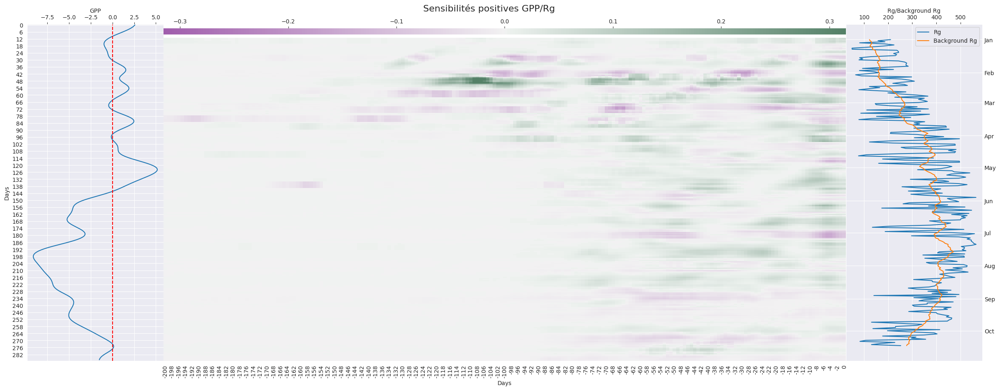

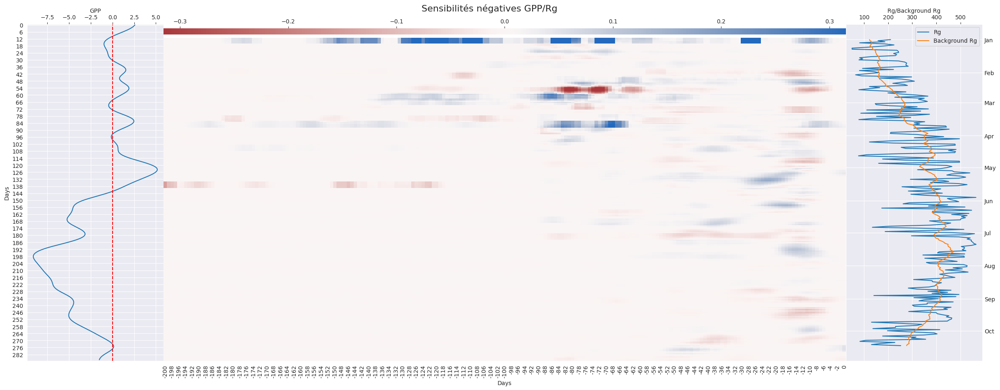

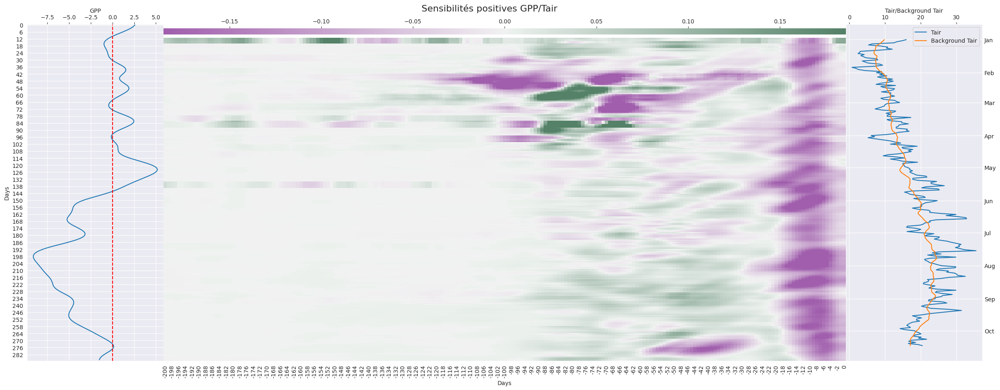

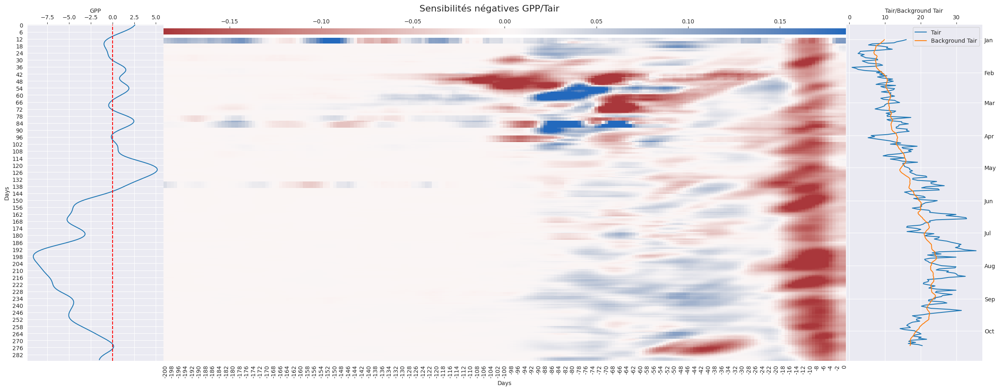

In [ ]:
##################### 1 Janvier => 15 octobre 2022 ##########################################

start_date,end_date='2022-01-01','2022-10-15'
range_values_10months=data[(data['DateTime']>=start_date) & (data['DateTime']<=end_date)]
L=len(range_values_10months)
first_day_idx=data[(data['DateTime'].dt.year==2022) & (data['DateTime'].dt.month==1) & (data['DateTime'].dt.day==1)].index[0]
last_day_idx=data[(data['DateTime'].dt.month==10) & (data['DateTime'].dt.year==2022) & (data['DateTime'].dt.day==15)].index[0]
N=200+1
y_range=range(0,L)

####################### Avec Conv #################################

import scipy.ndimage as sc
n=6
f=np.ones((n,n))/n**2

####################### Sensibilités positives GPP/VPD #################################

vpd_gradients=anom_integrated_gradients_10months[:,-N:,2]
vpd_gradients=sc.convolve(vpd_gradients,f)
pstv_grad_vpd_vect,ngtv_grad_vpd_vect=separate_grads(vpd_gradients,'VPD',start_date=start_date,end_date=end_date)

date_labels,date_ticks=generate_date_labels()

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités positives GPP/VPD",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
sat=50
palette=sns.diverging_palette(300,145,s=sat,as_cmap=True)
std_vpd=vpd_gradients.std()
sns.heatmap(sc.convolve(pstv_grad_vpd_vect,f),ax=ax2,center=0,vmin=-2*std_vpd,vmax=2*std_vpd,cmap=palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
rev_ticks=np.arange(-200,1,step=2)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('VPD',data=data,start_date=start_date,end_date=end_date),y_range,label='VPD')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'VPD'),y_range,label='Background VPD')
ax3.set_xlabel("VPD/Background VPD")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

####################### Sensibilités négatives GPP/VPD #################################

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités négatives GPP/VPD",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_vpd=vpd_gradients.std()
sns.heatmap(sc.convolve(ngtv_grad_vpd_vect,f),ax=ax2,center=0,vmin=-2*std_vpd,vmax=2*std_vpd,cmap=reversed_palette,cbar_kws=cbar_params)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('VPD',data=data,start_date=start_date,end_date=end_date),y_range,label='VPD')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'VPD'),y_range,label='Background VPD')
ax3.set_xlabel("VPD/Background VPD")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

###########################################################################################################

####################### Sensibilités positives GPP/Rg #################################

rg_gradients=anom_integrated_gradients_10months[:,-N:,0]
rg_gradients=sc.convolve(rg_gradients,f)
pstv_grad_rg_vect,ngtv_grad_rg_vect=separate_grads(rg_gradients,'Rg',start_date=start_date,end_date=end_date)

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités positives GPP/Rg",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
palette=sns.diverging_palette(300,145,s=sat,as_cmap=True)
std_rg=rg_gradients.std()
sns.heatmap(sc.convolve(pstv_grad_rg_vect,f),ax=ax2,center=0,vmin=-2*std_rg,vmax=2*std_rg,cmap=palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Rg',data=data,start_date=start_date,end_date=end_date),y_range,label='Rg')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Rg'),y_range,label='Background Rg')
ax3.set_xlabel("Rg/Background Rg")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

####################### Sensibilités négatives GPP/Rg #################################

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités négatives GPP/Rg",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_rg=rg_gradients.std()
sns.heatmap(sc.convolve(ngtv_grad_rg_vect,f),ax=ax2,center=0,vmin=-2*std_rg,vmax=2*std_rg,cmap=reversed_palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Rg',data=data,start_date=start_date,end_date=end_date),y_range,label='Rg')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Rg'),y_range,label='Background Rg')
ax3.set_xlabel("Rg/Background Rg")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

###########################################################################################################

####################### Sensibilités positives GPP/Tair #################################

tair_gradients=anom_integrated_gradients_10months[:,-N:,1]
pstv_grad_tair_vect,ngtv_grad_tair_vect=separate_grads(tair_gradients,'Tair',start_date=start_date,end_date=end_date)

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités positives GPP/Tair",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params={'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
palette=sns.diverging_palette(300,145,s=sat,as_cmap=True)
std_tair=tair_gradients.std()
sns.heatmap(sc.convolve(tair_gradients,f),ax=ax2,center=0,vmin=-2*std_tair,vmax=2*std_tair,cmap=palette,cbar_kws=cbar_params)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Tair',data=data,start_date=start_date,end_date=end_date),y_range,label='Tair')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Tair'),y_range,label='Background Tair')
ax3.set_xlabel("Tair/Background Tair")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

####################### Sensibilités négatives GPP/Tair #################################

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités négatives GPP/Tair",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params={'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_tair=tair_gradients.std()
sns.heatmap(sc.convolve(tair_gradients,f),ax=ax2,center=0,vmin=-2*std_tair,vmax=2*std_tair,cmap=reversed_palette,cbar_kws=cbar_params)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Tair',data=data,start_date=start_date,end_date=end_date),y_range,label='Tair')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Tair'),y_range,label='Background Tair')
ax3.set_xlabel("Tair/Background Tair")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

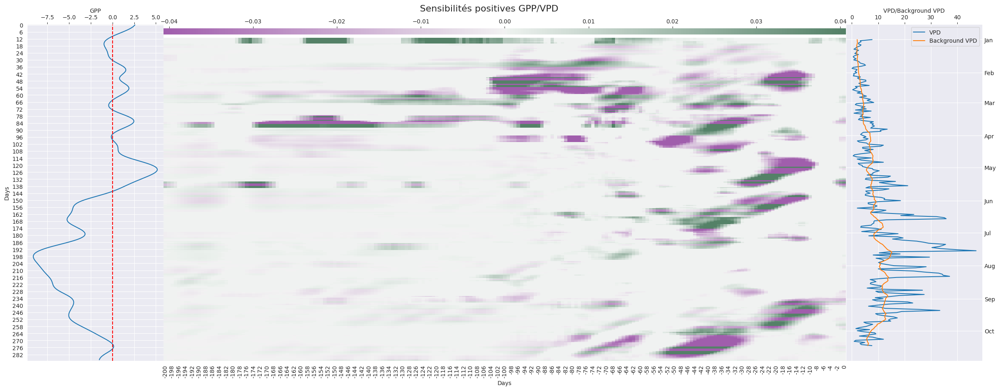

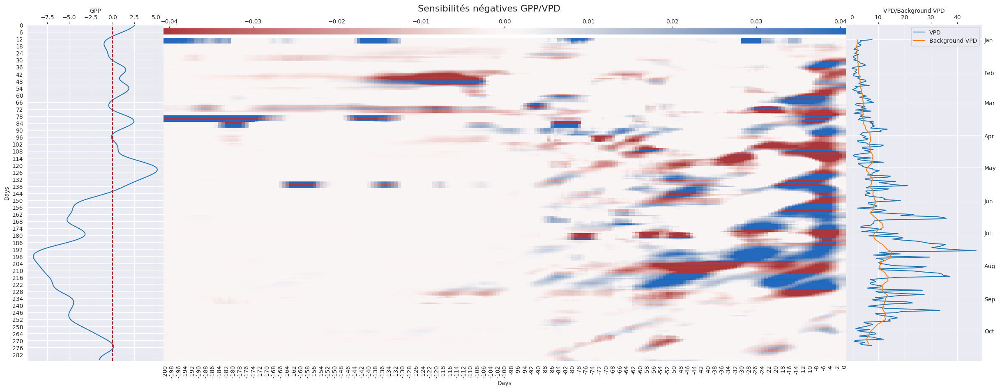

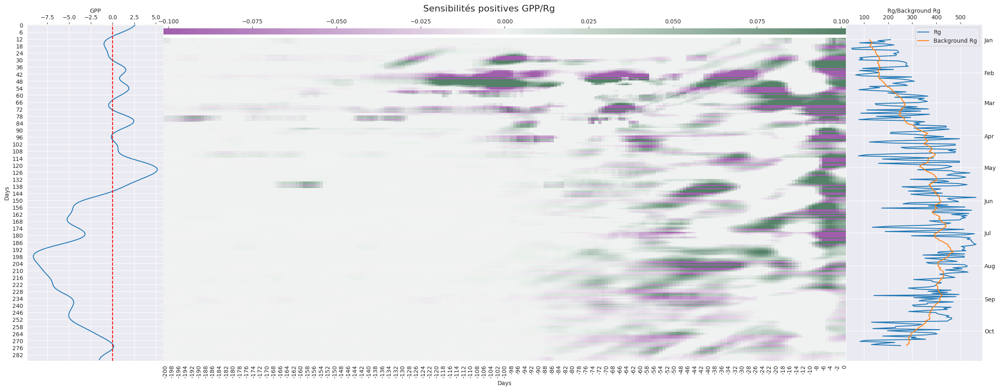

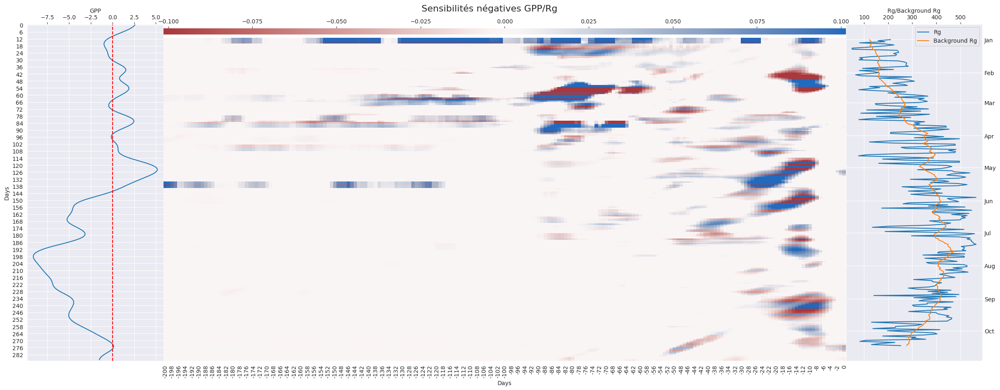

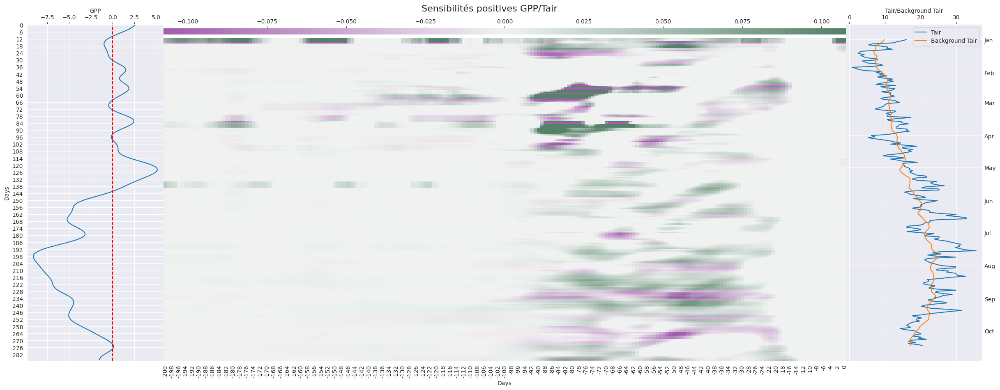

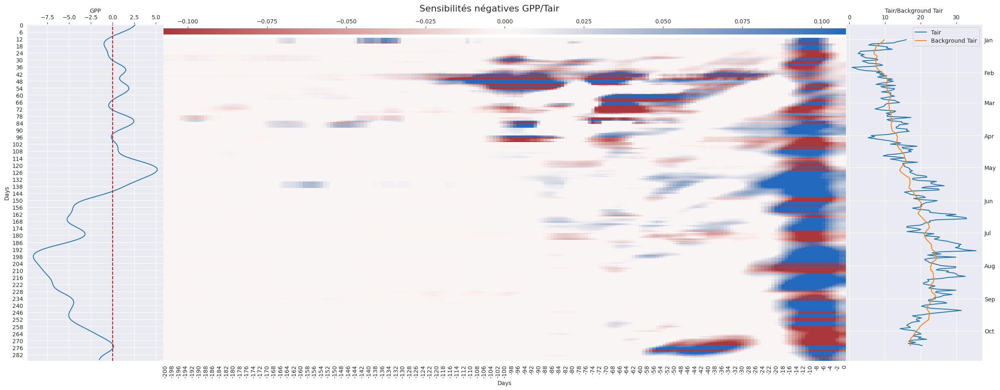

In [ ]:
##################### 1 Janvier => 15 octobre 2022 ##########################################

start_date,end_date='2022-01-01','2022-10-15'
range_values_10months=data[(data['DateTime']>=start_date) & (data['DateTime']<=end_date)]
L=len(range_values_10months)
first_day_idx=data[(data['DateTime'].dt.year==2022) & (data['DateTime'].dt.month==1) & (data['DateTime'].dt.day==1)].index[0]
last_day_idx=data[(data['DateTime'].dt.month==10) & (data['DateTime'].dt.year==2022) & (data['DateTime'].dt.day==15)].index[0]
N=200+1
y_range=range(0,L)

####################### Avec Conv #################################

import scipy.ndimage as sc
n=6
f=np.ones((n,n))/n**2
for i in range(1,n):
    f[i,-i:]=0

####################### Sensibilités positives GPP/VPD #################################

vpd_gradients=anom_integrated_gradients_10months[:,-N:,2]
vpd_gradients=sc.convolve(vpd_gradients,f)
pstv_grad_vpd_vect,ngtv_grad_vpd_vect=separate_grads(vpd_gradients,'VPD',start_date=start_date,end_date=end_date)

date_labels,date_ticks=generate_date_labels()

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités positives GPP/VPD",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
sat=50
palette=sns.diverging_palette(300,145,s=sat,as_cmap=True)
std_vpd=vpd_gradients.std()
sns.heatmap(pstv_grad_vpd_vect,ax=ax2,center=0,vmin=-2*std_vpd,vmax=2*std_vpd,cmap=palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
rev_ticks=np.arange(-200,1,step=2)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('VPD',data=data,start_date=start_date,end_date=end_date),y_range,label='VPD')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'VPD'),y_range,label='Background VPD')
ax3.set_xlabel("VPD/Background VPD")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

####################### Sensibilités négatives GPP/VPD #################################

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités négatives GPP/VPD",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_vpd=vpd_gradients.std()
sns.heatmap(ngtv_grad_vpd_vect,ax=ax2,center=0,vmin=-2*std_vpd,vmax=2*std_vpd,cmap=reversed_palette,cbar_kws=cbar_params)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('VPD',data=data,start_date=start_date,end_date=end_date),y_range,label='VPD')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'VPD'),y_range,label='Background VPD')
ax3.set_xlabel("VPD/Background VPD")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

###########################################################################################################

####################### Sensibilités positives GPP/Rg #################################

rg_gradients=anom_integrated_gradients_10months[:,-N:,0]
rg_gradients=sc.convolve(rg_gradients,f)
pstv_grad_rg_vect,ngtv_grad_rg_vect=separate_grads(rg_gradients,'Rg',start_date=start_date,end_date=end_date)

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités positives GPP/Rg",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
palette=sns.diverging_palette(300,145,s=sat,as_cmap=True)
std_rg=rg_gradients.std()
sns.heatmap(pstv_grad_rg_vect,ax=ax2,center=0,vmin=-2*std_rg,vmax=2*std_rg,cmap=palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Rg',data=data,start_date=start_date,end_date=end_date),y_range,label='Rg')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Rg'),y_range,label='Background Rg')
ax3.set_xlabel("Rg/Background Rg")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

####################### Sensibilités négatives GPP/Rg #################################

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités négatives GPP/Rg",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_rg=rg_gradients.std()
sns.heatmap(ngtv_grad_rg_vect,ax=ax2,center=0,vmin=-2*std_rg,vmax=2*std_rg,cmap=reversed_palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Rg',data=data,start_date=start_date,end_date=end_date),y_range,label='Rg')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Rg'),y_range,label='Background Rg')
ax3.set_xlabel("Rg/Background Rg")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

###########################################################################################################

####################### Sensibilités positives GPP/Tair #################################

tair_gradients=anom_integrated_gradients_10months[:,-N:,1]
tair_gradients=sc.convolve(tair_gradients,f)
pstv_grad_tair_vect,ngtv_grad_tair_vect=separate_grads(tair_gradients,'Tair',start_date=start_date,end_date=end_date)

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités positives GPP/Tair",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params={'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
palette=sns.diverging_palette(300,145,s=sat,as_cmap=True)
std_tair=tair_gradients.std()
sns.heatmap(pstv_grad_tair_vect,ax=ax2,center=0,vmin=-2*std_tair,vmax=2*std_tair,cmap=palette,cbar_kws=cbar_params)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Tair',data=data,start_date=start_date,end_date=end_date),y_range,label='Tair')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Tair'),y_range,label='Background Tair')
ax3.set_xlabel("Tair/Background Tair")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

####################### Sensibilités négatives GPP/Tair #################################

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités négatives GPP/Tair",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params={'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
custom_palette=sns.color_palette("vlag", as_cmap=True)
reversed_palette=sns.color_palette(list(reversed(custom_palette.colors)), as_cmap=True)
std_tair=tair_gradients.std()
sns.heatmap(ngtv_grad_tair_vect,ax=ax2,center=0,vmin=-2*std_tair,vmax=2*std_tair,cmap=reversed_palette,cbar_kws=cbar_params)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('Tair',data=data,start_date=start_date,end_date=end_date),y_range,label='Tair')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'Tair'),y_range,label='Background Tair')
ax3.set_xlabel("Tair/Background Tair")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
ax3.set_yticks(date_ticks)
ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()

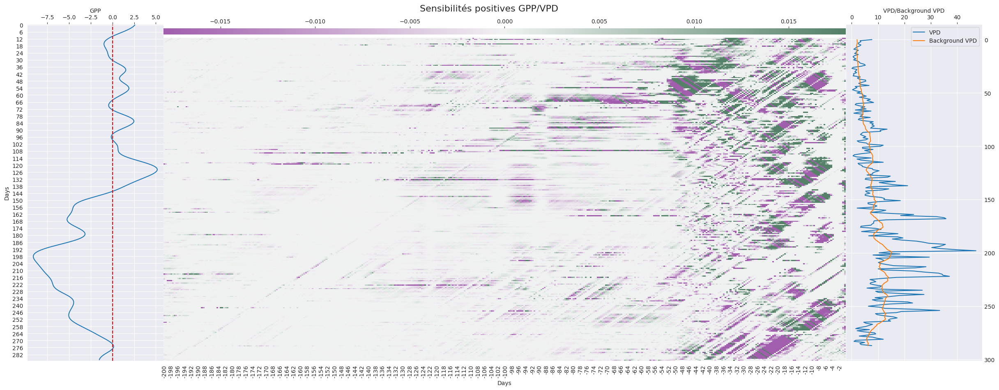

In [ ]:
##################### 1 Janvier => 15 octobre 2022 ##########################################

start_date,end_date='2022-01-01','2022-10-15'
range_values_10months=data[(data['DateTime']>=start_date) & (data['DateTime']<=end_date)]
L=len(range_values_10months)
first_day_idx=data[(data['DateTime'].dt.year==2022) & (data['DateTime'].dt.month==1) & (data['DateTime'].dt.day==1)].index[0]
last_day_idx=data[(data['DateTime'].dt.month==10) & (data['DateTime'].dt.year==2022) & (data['DateTime'].dt.day==15)].index[0]
N=200+1
y_range=range(0,L)

####################### Avec Conv #################################

import scipy.ndimage as sc
n=6
f=np.ones((n,n))/n**2
for i in range(1,n):
    f[i,-i:]=0

####################### Sensibilités positives GPP/VPD #################################

#vpd_gradients=anom_integrated_gradients_10months[:,-N:,2]
vpd_gradients=var_gradients
vpd_gradients=sc.convolve(vpd_gradients,f)
#pstv_grad_vpd_vect,ngtv_grad_vpd_vect=separate_grads(vpd_gradients,'VPD',start_date=start_date,end_date=end_date)
pstv_grad_vpd_vect,ngtv_grad_vpd_vect=pstv_grad_var_vect,ngtv_grad_var_vect
#date_labels,date_ticks=generate_date_labels()

fig = plt.figure(figsize=(30,10))
fig.suptitle("Sensibilités positives GPP/VPD",fontsize=16)
plt.subplots_adjust(top=0.93)
g=gs.GridSpec(1,3,figure=fig,width_ratios=[0.15,0.75,0.15],wspace=0)
ax1=fig.add_subplot(g[0,0])
ax2=fig.add_subplot(g[0,1],sharey=ax1)
ax3=fig.add_subplot(g[0,2])
ax1.plot(get_var_values('GPP_anomalies',data=data,start_date=start_date,end_date=end_date),y_range)
ax1.axvline(x=0,color='red',linestyle='--')
ax1.set_ylabel("Days")
ax1.set_xlabel("GPP")
ax1.tick_params(top=True,labeltop=True,labelbottom=False,bottom=False)
ax1.xaxis.set_label_position('top')

cbar_params = {'location': 'top','pad':0.01,'aspect':110,'fraction':.03}
sat=50
palette=sns.diverging_palette(300,145,s=sat,as_cmap=True)
std_vpd=vpd_gradients.std()
sns.heatmap(pstv_grad_vpd_vect,ax=ax2,center=0,vmin=-2*std_vpd,vmax=2*std_vpd,cmap=palette,cbar_kws=cbar_params)  # Replace with sns.heatmap
rev_ticks=np.arange(-200,0,step=2)
ax2.set_xticklabels(rev_ticks)
ax2.set_xlabel("Days")
ax2.tick_params(labelleft=False)

ax3.plot(get_var_values('VPD',data=data,start_date=start_date,end_date=end_date),y_range,label='VPD')
ax3.plot(values_plot_background(data,first_day_idx,last_day_idx,'VPD'),y_range,label='Background VPD')
ax3.set_xlabel("VPD/Background VPD")
ax3.legend()
ax3.tick_params(labelleft=False,top=True,labeltop=True,labelbottom=False,bottom=False,labelright=True)
ax3.tick_params(axis="y",direction="in")
ax3.xaxis.set_label_position('top')
# ax3.set_yticks(date_ticks)
# ax3.set_yticklabels([date_labels[i] for i in date_ticks])
#ax3.set_ylabel("Date")
ax3.invert_yaxis()
plt.show()